# eXplainable Artificial Intelligence (XAI) AIDA assigment

----

**Ιωάννης Τζανεττής**, 03003025, gtzanettis@mail.ntua.gr

**Ελένη Ψαρουδάκη**, 03002846, epsaroudaki@mail.ntua.gr

# 1 Installations

In [3]:
!pip install owlready2
!pip install lime
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 25.4 MB 1.7 MB/s 
  Created wheel for owlready2: filename=Owlready2-0.38-cp37-cp37m-linux_x86_64.whl size=22127098 sha256=f5f44af846a29ee71d879410066603fb1b7838ceff892b6822baff9cd0934465
  Stored in directory: /root/.cache/pip/wheels/ee/48/58/3ea20d69efcb97a26048fbfcce9332412077df80d4ae52365b
Successfully built owlready2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 3.6 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=1d213c10d681bf9c74c7c8360925abb70b556422797abd04b2b6831fd8b4be13
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import nltk
nltk.download('omw-1.4')
nltk.download('wordnet')
from nltk.corpus import wordnet as wn
import json 
from tqdm.notebook import tqdm
from owlready2 import *
from lime import lime_image
import numpy as np
from skimage.segmentation import mark_boundaries

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [5]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

# 2 Data set

Για τη δημιουργία του data set επιλέξαμε τις κλάσεις restaurant και street από το plases data set και κάθε μία από αυτές την αντιστοιχίσαμε σε υποσύνολα του COCO dataset. Συγκεκριμένα για την κατηγορία restaurant χρησιμοποιήσαμε το υποσύνολο που περιέχει τουλάχοστον τα αντικείμενα person, chair, dining table και wine glass, ενώ για την κατηγορία street τα αντικείμενα person, car, traffic light, handbag. 

## 2.1 Select and obtain synsets

In [6]:
places = ['restaurant','street']
coco_items = {}
coco_items[places[0]] = ['person','chair','dining table','wine glass']
coco_items[places[1]] = ['person','car','traffic light','handbag']
items = {}
items[places[0]] = ['person','chair','dining_table','wineglass']
items[places[1]] = ['person','car','traffic_light','handbag']
all_items = []
for p in places:
    for i in items[p]:
        if i not in all_items:
            all_items.append(i)
all_items

['person',
 'chair',
 'dining_table',
 'wineglass',
 'car',
 'traffic_light',
 'handbag']

In [7]:
synsets = {}
for p in places:
    synsets[p] = {i: wn.synsets(i) for i in items[p]}
synsets

{'restaurant': {'chair': [Synset('chair.n.01'),
   Synset('professorship.n.01'),
   Synset('president.n.04'),
   Synset('electric_chair.n.01'),
   Synset('chair.n.05'),
   Synset('chair.v.01'),
   Synset('moderate.v.01')],
  'dining_table': [Synset('dining_table.n.01')],
  'person': [Synset('person.n.01'),
   Synset('person.n.02'),
   Synset('person.n.03')],
  'wineglass': [Synset('wineglass.n.01')]},
 'street': {'car': [Synset('car.n.01'),
   Synset('car.n.02'),
   Synset('car.n.03'),
   Synset('car.n.04'),
   Synset('cable_car.n.01')],
  'handbag': [Synset('bag.n.04')],
  'person': [Synset('person.n.01'),
   Synset('person.n.02'),
   Synset('person.n.03')],
  'traffic_light': [Synset('traffic_light.n.01')]}}

In [8]:
synset_names = {}
synset_names[places[0]] = {i: sn for i,sn in zip(items[places[0]],['person.n.02','chair.n.01','dining_table.n.01','wineglass.n.01'])}
synset_names[places[1]] = {i: sn for i,sn in zip(items[places[1]],['person.n.02','car.n.01','traffic_light.n.01','bag.n.04'])}
synset_names

{'restaurant': {'chair': 'chair.n.01',
  'dining_table': 'dining_table.n.01',
  'person': 'person.n.02',
  'wineglass': 'wineglass.n.01'},
 'street': {'car': 'car.n.01',
  'handbag': 'bag.n.04',
  'person': 'person.n.02',
  'traffic_light': 'traffic_light.n.01'}}

In [9]:
lemma_lists = {}
lemma_lists[places[0]] = {i: [l.name() for l in wn.synset(synset_names[places[0]][i]).lemmas()] for i in items[places[0]]}
lemma_lists[places[1]] = {i: [l.name() for l in wn.synset(synset_names[places[1]][i]).lemmas()] for i in items[places[1]]}
lemma_lists

{'restaurant': {'chair': ['chair'],
  'dining_table': ['dining_table', 'board'],
  'person': ['person'],
  'wineglass': ['wineglass']},
 'street': {'car': ['car', 'auto', 'automobile', 'machine', 'motorcar'],
  'handbag': ['bag', 'handbag', 'pocketbook', 'purse'],
  'person': ['person'],
  'traffic_light': ['traffic_light', 'traffic_signal', 'stoplight']}}

In [10]:
lemmas = {}
lemmas[places[0]] = {i: lemma_lists[places[0]][i][id] for i,id in zip(items[places[0]],[0,0,0,0])}
lemmas[places[1]] = {i: lemma_lists[places[1]][i][id] for i,id in zip(items[places[1]],[0,0,0,1])}
lemmas

{'restaurant': {'chair': 'chair',
  'dining_table': 'dining_table',
  'person': 'person',
  'wineglass': 'wineglass'},
 'street': {'car': 'car',
  'handbag': 'handbag',
  'person': 'person',
  'traffic_light': 'traffic_light'}}

In [11]:
def get_parents(ss):
    return {p.lemmas()[0].name(): get_parents(p) for p in ss.hypernyms()}
    
H = {}    
for p in places:
    H[p] = {}
    for it in items[p]:
        H[p][it] = get_parents(wn.synset(synset_names[p][it]))
H

{'restaurant': {'chair': {'seat': {'furniture': {'furnishing': {'instrumentality': {'artifact': {'whole': {'object': {'physical_entity': {'entity': {}}}}}}}}}},
  'dining_table': {'table': {'furniture': {'furnishing': {'instrumentality': {'artifact': {'whole': {'object': {'physical_entity': {'entity': {}}}}}}}}}},
  'person': {'human_body': {'body': {'natural_object': {'whole': {'object': {'physical_entity': {'entity': {}}}}}}}},
  'wineglass': {'glass': {'container': {'instrumentality': {'artifact': {'whole': {'object': {'physical_entity': {'entity': {}}}}}}}}}},
 'street': {'car': {'motor_vehicle': {'self-propelled_vehicle': {'wheeled_vehicle': {'container': {'instrumentality': {'artifact': {'whole': {'object': {'physical_entity': {'entity': {}}}}}}},
      'vehicle': {'conveyance': {'instrumentality': {'artifact': {'whole': {'object': {'physical_entity': {'entity': {}}}}}}}}}}}},
  'handbag': {'container': {'instrumentality': {'artifact': {'whole': {'object': {'physical_entity': {'e

In [12]:
get_parents(wn.synset('chair.n.01'))

{'seat': {'furniture': {'furnishing': {'instrumentality': {'artifact': {'whole': {'object': {'physical_entity': {'entity': {}}}}}}}}}}

## 2.2 Create dataset

In [13]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2014.zip
!unzip annotations_trainval2014.zip

--2022-07-31 14:44:48--  http://images.cocodataset.org/annotations/annotations_trainval2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.75.12
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.75.12|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252872794 (241M) [application/zip]
Saving to: ‘annotations_trainval2014.zip’

annotations_trainva 100%[===================>] 241.16M  16.0MB/s    in 17s     

2022-07-31 14:45:05 (14.3 MB/s) - ‘annotations_trainval2014.zip’ saved [252872794/252872794]

Archive:  annotations_trainval2014.zip
  inflating: annotations/instances_train2014.json  
  inflating: annotations/instances_val2014.json  
  inflating: annotations/person_keypoints_train2014.json  
  inflating: annotations/person_keypoints_val2014.json  
  inflating: annotations/captions_train2014.json  
  inflating: annotations/captions_val2014.json  


In [14]:
with open("/content/annotations/instances_train2014.json", "rb") as f:
    data = json.load(f)

In [15]:
def is_sublist(list1, list2):
    l1 = list1.copy()
    l2 = list2.copy()
    for l in l1:
        if l in l2:
            l2.remove(l)
        else:
            return False
    return True

class COCO:
    def __init__(self, json_data):
        self.json_data = json_data
        self.categories = {}
        self.coco = {}
        for im in self.json_data["images"]:
            self.coco[im["id"]] = {"url": im["flickr_url"]} # αρχικά αποθηκευούμε για κάθε εικόνα το url της ώστε να μπορέσουμε να το εκτυπώσουμε
    
        for cat in self.json_data["categories"]:
            self.categories[cat["id"]] = {"name": cat["name"], "supercategory": cat["supercategory"]} 

        anns_per_image = {}
        print ("Loading Coco Metadata")
        for ann in tqdm(self.json_data["annotations"]):
            if ann["image_id"] not in anns_per_image:
                anns_per_image[ann["image_id"]] = {"label_ids": [ann["category_id"]], "label_texts": [self.categories[ann["category_id"]]["name"]]}
            else:
                anns_per_image[ann["image_id"]]["label_ids"].append(ann["category_id"])
                anns_per_image[ann["image_id"]]["label_texts"].append(self.categories[ann["category_id"]]["name"])
        # ενώνουμε τις κατηγορίες με το dict των εικόνων 
        for im_id in list(self.coco):
            if im_id in anns_per_image:
                self.coco[im_id]["label_ids"] = anns_per_image[im_id]["label_ids"]
                self.coco[im_id]["label_texts"] = anns_per_image[im_id]["label_texts"]
            else:
                self.coco.pop(im_id, None) # αν δεν έχουμε annotations σβήνουμε το key αυτό 

    def prune_dataset(self, labels):
        image_ids = list(self.coco.keys())
        for image_id in image_ids:
            if not is_sublist(labels, self.coco[image_id]["label_texts"]):
                self.coco.pop(image_id, None)

In [16]:
# διατήρηση μόνο των εικόνων που έχουν τα αντικείμενα coco_items 

dataset = {}
for p in places:
    dataset[p] = COCO(data)
    print (f"COCO keys: {dataset[p].coco[list(dataset[p].coco.keys())[0]].keys()}")
    print (f"Size of dataset before Pruning: {len(dataset[p].coco)}")
    dataset[p].prune_dataset(coco_items[p])
    print (f"Size of dataset after Pruning: {len(dataset[p].coco)}")


# for p in places:
#   print(dataset[p].coco[list(dataset[p].coco.keys())[0]])

Loading Coco Metadata


  0%|          | 0/604907 [00:00<?, ?it/s]

COCO keys: dict_keys(['url', 'label_ids', 'label_texts'])
Size of dataset before Pruning: 82081
Size of dataset after Pruning: 462
Loading Coco Metadata


  0%|          | 0/604907 [00:00<?, ?it/s]

COCO keys: dict_keys(['url', 'label_ids', 'label_texts'])
Size of dataset before Pruning: 82081
Size of dataset after Pruning: 347


# 3 WordNet - Knowledge extraction

Για τη δημιουργία της γνώσης, οι πληροφορίες της κάθε εικόνας για την ύπαρξη των αντικειμένων συνδέθηκε με τα αντίστοιχα WordNet synsets.




In [17]:
onto = get_ontology('http://coco_οntology_rs_new2/')

## ids των εικόνων
ids = {}
for p in places:
    ids[p] = [k for k in dataset[p].coco]

df = pd.DataFrame()

with onto:
  ## Ορισμός εννοιών για εικόνες και αντικείμενα
  class Image(Thing):
    namespace=onto
    pass

  class DepictedObject(Thing):
    namespace=onto
    pass

  ## Ορισμός ρόλου "hasObject" (ποιες εικόνες περιέχουν ποια αντικείμενα)
  class hasObject(Image>>DepictedObject):
    namespace=onto
    pass

  ## Ορισμός ρόλου "hasHyperObject" (ποιες εικόνες περιέχουν ποια hyper αντικείμενα)
  class hasHyperObject(Image>>DepictedObject):
    namespace=onto
    pass
    
  tdataset = {}
  
  ## Για κάθε εικόνα
  for p in places:
      tdataset[p] = {}
      for im_id in ids[p]:
        ## Δημιουργία individual τύπου "Image"
        im = onto['Image'](str(im_id))
        obj_list = dataset[p].coco[im_id]['label_texts']

        tdataset[p][im_id] = {}
        tdataset[p][im_id]['label_texts'] = ""
        tdataset[p][im_id]['image_id'] = im_id
        
        ## Για κάθε αντικείμενο στην εικόνα:
        for obj_name in obj_list:
            ## Εύρεση πρώτου synset στο wordnet
            obj_name = obj_name.replace(" ","_")
            synsets = wn.synsets(obj_name)

            if len(synsets)<1:
                continue
      
            ## Δημιουργία individual τύπου "Object"
            obj = onto['DepictedObject']()

            ## Σύνδεση της εικόνας με το αντικείμενο μέσω του ρόλου hasObject
            im.hasObject.append(obj)

            synset = wn.synsets(obj_name)[0].name()

      
            ## Αν υπάρχει η αντίστοιχη έννοια στη γνώση
            if onto[synset] in onto.classes():
                ## Ορίζουμε το αντικείμενο obj ως τύπου "synset"
                obj.is_a.append(onto[synset])

                hyper = lambda s:s.hypernyms()
                hypers = [s.name() for s in list(wn.synset(synset).closure(hyper))]
                hypers = reversed(hypers)
                father = Thing
                for h in hypers:
                    father = onto[h]
                    tdataset[p][im_id]['label_texts'] += h.split('.', 1)[0]+" "

            ## Αν δεν υπάρχει η αντίστοιχη έννοια στη γνώση, την ορίζουμε, μαζί με τις υπερέννοιές της
            else:
                ## Εύρεση υπερώνυμων
                hyper = lambda s:s.hypernyms()
                hypers = [s.name() for s in list(wn.synset(synset).closure(hyper))]
                hypers = reversed(hypers)
                ## Ορισμός ιεραρχίας εννοιών
                father = Thing
                for h in hypers:
                    if onto[h] not in onto.classes():
                        with onto:
                            cl = types.new_class(h,(father,))

                    father = onto[h]
                    print(onto[h])
                    tdataset[p][im_id]['label_texts'] += h.split('.', 1)[0]+" "
                if onto[synset] not in onto.classes():
                    with onto:
                        cl = types.new_class(synset,(father,))
                ## Ορίζουμε το αντικείμενο obj ως τύπου "synset"
                with onto:
                    obj.is_a.append(onto[synset])
            
            tdataset[p][im_id]['label_texts'] += obj_name + " "
        df = df.append(tdataset[p][im_id], ignore_index = True)

  ## Αποθηκεύουμε την οντολογία
  onto.save('coco_οnto_rs.nt',format='ntriples')

coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.instrumentality.n.03
coco_οntology_rs_new2.medium.n.01
coco_οntology_rs_new2.telecommunication.n.01
coco_οntology_rs_new2.broadcasting.n.02
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.commodity.n.01
coco_οntology_rs_new2.consumer_goods.n.01
coco_οntology_rs_new2.durables.n.01
coco_οntology_rs_new2.appliance.n.02
coco_οntology_rs_new2.home_appliance.n.01
coco_οntology_rs_new2.white_goods.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.instrumentality.n.03
coco_οntology_rs_new2.

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_new2.snack_food.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.creation.n.02
coco_οntology_rs_new2.product.n.02
coco_οntology_rs_new2.work.n.02
coco_οntology_rs_new2.publication.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.instrumentality.n.03
coco_οntology_rs_new2.container.n.01
coco_οntology_rs_new2.vessel.n.03
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.natural_object.n.01
coco_οntology_rs_new2.plant_part.n.01
coco_οntology_rs_new2.plant_organ.n.01
coco_οntology_rs_new2.root.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):
/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.natural_object.n.01
coco_οntology_rs_new2.matter.n.03
coco_οntology_rs_new2.plant_part.n.01
coco_οntology_rs_new2.solid.n.01
coco_οntology_rs_new2.plant_organ.n.01
coco_οntology_rs_new2.food.n.02
coco_οntology_rs_new2.reproductive_structure.n.01
coco_οntology_rs_new2.produce.n.01
coco_οntology_rs_new2.fruit.n.01
coco_οntology_rs_new2.edible_fruit.n.01
coco_οntology_rs_new2.citrus.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.living_thing.n.01
coco_οntology_rs_new2.organism.n.01
coco_οntology_rs_new2.plant.n.02
coco_οntology_rs_new2.vascular_plant.n.01
coco_οntology_rs_new2.herb.n.01
coco_οntology_rs_new2.crucifer.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_ο

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.natural_object.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.natural_object.n.01
coco_οntology_rs_new2.plant_part.n.01
coco_οntology_rs_new2.matter.n.03
coco_οntology_rs_new2.plant_part.n.01
coco_οntology_rs_new2.plant_organ.n.01
coco_οntology_rs_new2.solid.n.01
coco_οntology_rs_new2.plant_organ.n.01
coco_οntology_rs_new2.reproductive_structure.n.01
coco_οntology_rs_new2.food.n.02
coco_οntology_rs_new2.reproductive_structure.n.01
coco_οntology_rs_new2.fruit.n.01
coco_οntology_rs_new2.produce.n.01
coco_οntology_rs_new2.fruit.n.01
coco_οntology_rs_new2.pome.n.01
coco_οntology_rs_new2.edible_fruit.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('implement.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.conveyance.n.03
coco_οntology_rs_new2.instrumentality.n.03
coco_οntology_rs_new2.vehicle.n.01
coco_οntology_rs_new2.container.n.01
coco_οntology_rs_new2.wheeled_vehicle.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.living_thing.n.01
coco_οntology_rs_new2.organism.n.01
coco_οntology_rs_new2.animal.n.01
coco_οntology_rs_new2.chordate.n.01
coco_οntology_rs_new2.vertebrate.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.instrumentality.n.03
coco_οntology_rs_new2.tool.n.01
coco_οntology_rs_new2.implement.n.01
coco

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 8
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.living_thing.n.01
coco_οntology_rs_new2.organism.n.01
coco_οntology_rs_new2.animal.n.01
coco_οntology_rs_new2.chordate.n.01
coco_οntology_rs_new2.vertebrate.n.01
coco_οntology_rs_new2.mammal.n.01
coco_οntology_rs_new2.placental.n.01
coco_οntology_rs_new2.rodent.n.01
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.abstraction.n.06
coco_οntology_rs_new2.communication.n.02
coco_οntology_rs_new2.signal.n.01
coco_οntology_rs_new2.visual_signal.n.01
coco_οntology_rs_new2.light.n.14
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.instrumentality.n.03
coco_οntology_rs_new2.conveyance.n.03
coco_οntology_rs_new2.public_transport.n.01
coco_οntology_rs_new2.entity.n.01
coco_ο

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.conveyance.n.03
coco_οntology_rs_new2.instrumentality.n.03
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.vehicle.n.01
coco_οntology_rs_new2.container.n.01
coco_οntology_rs_new2.sheet.n.06
coco_οntology_rs_new2.wheeled_vehicle.n.01
coco_οntology_rs_new2.board.n.03
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.sheet.n.06
coco_οntology_rs_new2.board.n.03
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.living_thing.n.01
coco_οntology_rs_new2.organism.n.01
coco_οntology_rs_new2.animal.n.01
coco_οntology_rs_new2.chordate.n.01
coco_οntology_rs_new2.

Ως αποτέλεσμα των παραπάνω έχουμε δημιουργήσει την οντολογία του προβλήματός μας την οποία χρησιμοποιούμε για να τρέξουμε τα SPARQL queries της ενότητας 7. Επιπλέον, δημιουργήσαμε ένα dataframe το οποίο επεξεργαζόμαστε περαιτέρω στην εότητα 5 και το οποίο περιέχει τις έννοιες που βρίσκονται στις εικόνες του dataset όπως εξάγονται από τα labels του COCO και την ιεραρχία του wordnet.

In [18]:
df

,label_texts,image_id
0,entity physical_entity object whole artifact i...,214704.0
1,entity physical_entity object whole artifact i...,311933.0
2,entity physical_entity object whole artifact i...,505700.0
3,entity physical_entity object whole artifact i...,471245.0
4,entity physical_entity object whole artifact i...,84391.0
...,...,...
804,entity physical_entity object whole artifact c...,145761.0
805,entity physical_entity object whole artifact c...,80090.0
806,entity physical_entity object whole artifact c...,108701.0
807,entity physical_entity object whole artifact c...,114310.0


In [19]:
for e in onto.classes():
    print(e)

coco_οntology_rs_new2.Image
coco_οntology_rs_new2.DepictedObject
coco_οntology_rs_new2.entity.n.01
coco_οntology_rs_new2.physical_entity.n.01
coco_οntology_rs_new2.object.n.01
coco_οntology_rs_new2.whole.n.02
coco_οntology_rs_new2.artifact.n.01
coco_οntology_rs_new2.instrumentality.n.03
coco_οntology_rs_new2.medium.n.01
coco_οntology_rs_new2.telecommunication.n.01
coco_οntology_rs_new2.broadcasting.n.02
coco_οntology_rs_new2.television.n.01
coco_οntology_rs_new2.commodity.n.01
coco_οntology_rs_new2.consumer_goods.n.01
coco_οntology_rs_new2.durables.n.01
coco_οntology_rs_new2.appliance.n.02
coco_οntology_rs_new2.home_appliance.n.01
coco_οntology_rs_new2.white_goods.n.01
coco_οntology_rs_new2.refrigerator.n.01
coco_οntology_rs_new2.furnishing.n.02
coco_οntology_rs_new2.furniture.n.01
coco_οntology_rs_new2.seat.n.03
coco_οntology_rs_new2.chair.n.01
coco_οntology_rs_new2.table.n.03
coco_οntology_rs_new2.dining_table.n.01
coco_οntology_rs_new2.living_thing.n.01
coco_οntology_rs_new2.organis

In [20]:
# From github, is this different? Find out

# coco = COCO(coco_metadata_path)
# # and define a subset with the spesified objects 
# coco.create_dataset(dataset_objects, predictions = predictions)
# # and then we have to create for each image the most spesific query
# queries = {}
# for im_id in coco.coco:
#     queries[im_id] = create_msq(coco, im_id)


# # using also the tbox in order for every query to have the hierachy 
# tbox = create_tbox_coco(queries,materialize=True) # materialize tbox
# queries = {k: rewrite_query(queries[k],tbox) for k in queries} # add concepts of hierarcy in query most spesific query
# # for example if an image (or a query) contains a cat then we will also add in this object mamal, living thing ....

# print ("This is a sample of a most spesified query for an image: ")
# print (queries[list(queries.keys())[0]].concepts)

# 4 Places Classifier

Χρησιμοποιούμε τον δοσμένο classifier. Κάνουμε κάποιες τροποποιήσεις και προσθήκες στη μέθοδο classify που επιτρέπουν την χρήση της μεθόδο LIME αργότερα. Προσθέτουμε τη μέθοδο classifyWithLabels που αντιστοιχεί στην αρχική classify και τέλος την classifyWithGradCam που αντιστοιχεί στην ενότητα 5.5. Ο κώδικας που αντιστοιχεί στην Grad-CAM (ενότητα 5.5) βρίσκεται στα επόμενα κελιά και έχει προκύψει από το [repo του places365](https://github.com/CSAILVision/places365/blob/master/run_placesCNN_unified.py).

In [21]:
# PlacesCNN to predict the scene category, attribute, and class activation map in a single pass
# by Bolei Zhou, sep 2, 2017
# updated, making it compatible to pytorch 1.x in a hacky way

import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
import numpy as np
import cv2
from PIL import Image


 # hacky way to deal with the Pytorch 1.0 update
def recursion_change_bn(module):
    if isinstance(module, torch.nn.BatchNorm2d):
        module.track_running_stats = 1
    else:
        for i, (name, module1) in enumerate(module._modules.items()):
            module1 = recursion_change_bn(module1)
    return module

def load_labels():
    # prepare all the labels
    # scene category relevant
    file_name_category = 'categories_places365.txt'
    if not os.access(file_name_category, os.W_OK):
        synset_url = 'https://raw.githubusercontent.com/csailvision/places365/master/categories_places365.txt'
        os.system('wget ' + synset_url)
    classes = list()
    with open(file_name_category) as class_file:
        for line in class_file:
            classes.append(line.strip().split(' ')[0][3:])
    classes = tuple(classes)

    # indoor and outdoor relevant
    file_name_IO = 'IO_places365.txt'
    if not os.access(file_name_IO, os.W_OK):
        synset_url = 'https://raw.githubusercontent.com/csailvision/places365/master/IO_places365.txt'
        os.system('wget ' + synset_url)
    with open(file_name_IO) as f:
        lines = f.readlines()
        labels_IO = []
        for line in lines:
            items = line.rstrip().split()
            labels_IO.append(int(items[-1]) -1) # 0 is indoor, 1 is outdoor
    labels_IO = np.array(labels_IO)

    # scene attribute relevant
    file_name_attribute = 'labels_sunattribute.txt'
    if not os.access(file_name_attribute, os.W_OK):
        synset_url = 'https://raw.githubusercontent.com/csailvision/places365/master/labels_sunattribute.txt'
        os.system('wget ' + synset_url)
    with open(file_name_attribute) as f:
        lines = f.readlines()
        labels_attribute = [item.rstrip() for item in lines]
    file_name_W = 'W_sceneattribute_wideresnet18.npy'
    if not os.access(file_name_W, os.W_OK):
        synset_url = 'http://places2.csail.mit.edu/models_places365/W_sceneattribute_wideresnet18.npy'
        os.system('wget ' + synset_url)
    W_attribute = np.load(file_name_W)

    return classes, labels_IO, labels_attribute, W_attribute

def hook_feature(module, input, output):
    features_blobs.append(np.squeeze(output.data.cpu().numpy()))

def returnCAM(feature_conv, weight_softmax, class_idx):
    # generate the class activation maps upsample to 256x256
    size_upsample = (256, 256)
    nc, h, w = feature_conv.shape
    output_cam = []
    for idx in class_idx:
        cam = weight_softmax[class_idx].dot(feature_conv.reshape((nc, h*w)))
        cam = cam.reshape(h, w)
        cam = cam - np.min(cam)
        cam_img = cam / np.max(cam)
        cam_img = np.uint8(255 * cam_img)
        output_cam.append(cv2.resize(cam_img, size_upsample))
    return output_cam

def returnTF():
# load the image transformer
    tf = trn.Compose([
        trn.Resize((224,224)),
        trn.ToTensor(),
        trn.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    return tf


def load_model():
    # this model has a last conv feature map as 14x14

    model_file = 'wideresnet18_places365.pth.tar'
    if not os.access(model_file, os.W_OK):
        os.system('wget http://places2.csail.mit.edu/models_places365/' + model_file)
        os.system('wget https://raw.githubusercontent.com/csailvision/places365/master/wideresnet.py')

    import wideresnet
    model = wideresnet.resnet18(num_classes=365)
    checkpoint = torch.load(model_file, map_location=lambda storage, loc: storage)
    state_dict = {str.replace(k,'module.',''): v for k,v in checkpoint['state_dict'].items()}
    model.load_state_dict(state_dict)
    
    # hacky way to deal with the upgraded batchnorm2D and avgpool layers...
    for i, (name, module) in enumerate(model._modules.items()):
        module = recursion_change_bn(model)
    model.avgpool = torch.nn.AvgPool2d(kernel_size=14, stride=1, padding=0)
    
    model.eval()



    # the following is deprecated, everything is migrated to python36

    ## if you encounter the UnicodeDecodeError when use python3 to load the model, add the following line will fix it. Thanks to @soravux
    #from functools import partial
    #import pickle
    #pickle.load = partial(pickle.load, encoding="latin1")
    #pickle.Unpickler = partial(pickle.Unpickler, encoding="latin1")
    #model = torch.load(model_file, map_location=lambda storage, loc: storage, pickle_module=pickle)

    model.eval()
    # hook the feature extractor
    features_names = ['layer4','avgpool'] # this is the last conv layer of the resnet
    for name in features_names:
        model._modules.get(name).register_forward_hook(hook_feature)
    return model


# load the labels
classes, labels_IO, labels_attribute, W_attribute = load_labels()

# load the model
features_blobs = []
model = load_model()

# load the transformer
tf = returnTF() # image transformer

# get the softmax weight
params = list(model.parameters())
weight_softmax = params[-2].data.numpy()
weight_softmax[weight_softmax<0] = 0

In [22]:
def read_image_from_url(img_url):
    img = io.imread(img_url)
    img = Image.fromarray(img)
    return img

class Classifier:
    def __init__(self, arch):
        # th architecture to use
        self.arch = arch

        # load the pre-trained weights
        self.model_file = '%s_places365.pth.tar' % self.arch
        if not os.access(self.model_file, os.W_OK):
            weight_url = 'http://places2.csail.mit.edu/models_places365/' + self.model_file
            os.system('wget ' + weight_url)

        self.model = models.__dict__[arch](num_classes=365)
        checkpoint = torch.load(self.model_file, map_location=lambda storage, loc: storage)
        state_dict = {str.replace(k,'module.',''): v for k,v in checkpoint['state_dict'].items()}
        self.model.load_state_dict(state_dict)
        self.model.eval()


        # load the image transformer
        self.centre_crop = trn.Compose([
                trn.Resize((256,256)),
                trn.CenterCrop(224),
                trn.ToTensor(),
                trn.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

        # load the class label
        file_name = 'categories_places365.txt'
        if not os.access(file_name, os.W_OK):
            synset_url = 'https://raw.githubusercontent.com/csailvision/places365/master/categories_places365.txt'
            os.system('wget ' + synset_url)
        
        self.classes = list()
        with open(file_name) as class_file:
            for line in class_file:
                self.classes.append(line.strip().split(' ')[0][3:])
        self.classes = tuple(self.classes)


    # load the test image
    def classify(self, images):
        res = []
        #img = io.imread(img_url)
        for img in images:
            img = Image.fromarray((img * 255).astype(np.uint8))
            input_img = V(self.centre_crop(img).unsqueeze(0))

            # forward pass
            logit = self.model.forward(input_img)
            h_x = F.softmax(logit, 1).data.squeeze()
            probs, idx = h_x.sort(0, True)
            
            # output the prediction
            preds = []
            for i in range(0, 5):
                #preds.append({self.classes[idx[i]]: float(probs[i])})
                preds.append(float(probs[i]))
            res.append(np.array(preds))
        return np.array(res)


    def classifyWithLabels(self, img_url, labels_num = 5):
          img = io.imread(img_url)
          img = Image.fromarray(img)
          input_img = V(self.centre_crop(img).unsqueeze(0))

          # forward pass
          logit = self.model.forward(input_img)
          h_x = F.softmax(logit, 1).data.squeeze()
          probs, idx = h_x.sort(0, True)
          # output the prediction
          preds = []
          for i in range(0, labels_num):
              preds.append([self.classes[idx[i]], float(probs[i])])
          return preds


    # added code from "https://github.com/CSAILVision/places365/blob/master/run_placesCNN_unified.py"
    def classifyWIthGradCam(self, img_url,cat, img_id):     
        image =read_image_from_url(img_url)
        input_img = V(tf(image).unsqueeze(0))

        # forward pass
        logit = model.forward(input_img)
        h_x = F.softmax(logit, 1).data.squeeze()
        probs, idx = h_x.sort(0, True)
        probs = probs.numpy()
        idx = idx.numpy()
        print('--SCENE CATEGORIES:'+ img_url)
        # output the IO prediction
        print('--SCENE ATTRIBUTES:')
        for i in range(0, 5):
            print('{:.3f} -> {}'.format(probs[i], classes[idx[i]]))

        # output the scene attributes
        responses_attribute = W_attribute.dot(features_blobs[1])
        idx_a = np.argsort(responses_attribute)
        print('-- ATTRIBUTES:')
        print(', '.join([labels_attribute[idx_a[i]] for i in range(-1,-10,-1)]))

        # generate class activation mapping

        print('Class activation map is saved in "/heatmap_' + cat+'_'+ str(img_id) +'.jpg"')
        CAMs = returnCAM(features_blobs[0], weight_softmax, [idx[0]])

        # render the CAM and output
        imgs = io.imread(img_url)
        height, width, _ = imgs.shape
        heatmap = cv2.applyColorMap(cv2.resize(CAMs[0],(width, height)), cv2.COLORMAP_JET)   
        result = heatmap * 0.4 + imgs * 0.5
        imagepath = 'map/heatmap_'+cat+'_' + str(img_id) +'.jpg'
        cv2.imwrite(imagepath, result)
        
        return imagepath

## 4.1 Run predictor

In [23]:
predictor = Classifier("resnet18")

Image url: http://farm9.staticflickr.com/8141/7640723682_e45033ac22_z.jpg
Predictions
--SCENE CATEGORIES:http://farm9.staticflickr.com/8141/7640723682_e45033ac22_z.jpg
--SCENE ATTRIBUTES:
0.780 -> pizzeria
0.017 -> bakery/shop
0.017 -> food_court
0.016 -> ice_cream_parlor
0.015 -> fastfood_restaurant
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "/heatmap_restaurant_285891.jpg"


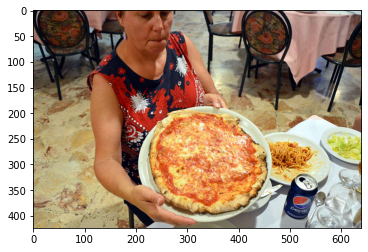

In [24]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

place_id = 0
image_it = 5
image_id = list(dataset[places[place_id]].coco.keys())[image_it]
#image_url = "https://farm5.staticflickr.com/4141/4909108695_62224087a9_z.jpg"
image_url = dataset[places[place_id]].coco[image_id]['url']

print (f"Image url: {image_url}")
img = read_image_from_url(image_url)
plt.imshow(img)

print("Predictions")
path = predictor.classifyWIthGradCam(image_url, places[place_id], image_id)

# predictor.classifyWithLabels(img,2)

## 4.2 Get smaller data set ids

Απορρίπτουμε όλες τις εικόνες που ο places classifier δεν έχει προβλέψει τον επιθυμητό classifier στις πέντε πιθανότερες ετικέτες. Αυτή τη λίστα θα χρησιμοποιήσουμε αργότερα (ενότητα 6)

In [25]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

statistics = []
statistics2 = []
prob_correct_list = {}
prob_not_correct_list = {}
for place_id in [0,1]:
    statistics.append({})
    statistics2.append({})
    prob_correct_list[places[place_id]] = []
    prob_not_correct_list[places[place_id]] = []
    for image_id in list(dataset[places[place_id]].coco.keys()):
        try:
          image_url = dataset[places[place_id]].coco[image_id]['url']
          prediction_list = predictor.classifyWithLabels(image_url)
          ll = set()
          for k in prediction_list:
              ll.add(k[0])
              if k[0] in statistics[place_id]:
                  statistics[place_id][k[0]] = statistics[place_id][k[0]] + 1
              else:
                  statistics[place_id][k[0]] = 1
              if k[0] == places[place_id]:
                   [place_id].append(image_url)
          print(ll)

          if places[place_id] in ll:
              for lll in ll:
                    if lll in statistics2[place_id]:
                        statistics2[place_id][lll] = statistics2[place_id][lll] + 1
                    else:
                        statistics2[place_id][lll] = 1
              print('yes')
              prob_correct_list[places[place_id]].append((image_url, image_id))
          prob_not_correct_list[places[place_id]].append((image_url, image_id))
        except:
              pass      
print(prob_correct_list)
for place_id in [0,1]:
    print(statistics[place_id].keys())


{'television_studio', 'physics_laboratory', 'amusement_arcade', 'science_museum', 'chemistry_lab'}
{'pub/indoor', 'physics_laboratory', 'beer_garden', 'beer_hall', 'ice_cream_parlor'}
{'restaurant_patio', 'pub/indoor', 'restaurant', 'beer_garden', 'beer_hall'}
yes
{'coffee_shop', 'restaurant', 'pizzeria', 'delicatessen', 'cafeteria'}
yes
{'coffee_shop', 'pantry', 'delicatessen', 'general_store/indoor', 'bakery/shop'}
{'restaurant', 'pizzeria', 'delicatessen', 'food_court', 'bakery/shop'}
yes
{'restaurant', 'pizzeria', 'restaurant_kitchen', 'cafeteria', 'dining_hall'}
yes
{'dining_room', 'restaurant', 'banquet_hall', 'cafeteria', 'dining_hall'}
yes
{'library/indoor', 'food_court', 'office', 'cafeteria', 'dining_hall'}
{'coffee_shop', 'restaurant', 'pizzeria', 'cafeteria', 'beer_hall'}
yes
{'restaurant_patio', 'restaurant', 'pizzeria', 'beer_garden', 'cafeteria'}
yes
{'dining_room', 'sushi_bar', 'flea_market/indoor', 'beer_hall', 'dining_hall'}
{'fastfood_restaurant', 'pizzeria', 'delica

In [26]:
for place_id in [0,1]:
  print(places[place_id])
  print(statistics[place_id].keys())
  print(len(statistics[place_id].keys()))

  print(statistics2[place_id].keys())
  print(len(statistics2[place_id].keys()))

restaurant
dict_keys(['television_studio', 'science_museum', 'physics_laboratory', 'amusement_arcade', 'chemistry_lab', 'beer_garden', 'beer_hall', 'ice_cream_parlor', 'pub/indoor', 'restaurant', 'restaurant_patio', 'delicatessen', 'coffee_shop', 'pizzeria', 'cafeteria', 'general_store/indoor', 'pantry', 'bakery/shop', 'food_court', 'restaurant_kitchen', 'dining_hall', 'banquet_hall', 'dining_room', 'library/indoor', 'office', 'sushi_bar', 'flea_market/indoor', 'fastfood_restaurant', 'beauty_salon', 'art_school', 'conference_room', 'lecture_room', 'conference_center', 'legislative_chamber', 'classroom', 'elevator/door', 'elevator_lobby', 'market/indoor', 'ballroom', 'discotheque', 'airplane_cabin', 'stage/outdoor', 'bar', 'bookstore', 'jewelry_shop', 'art_studio', 'galley', 'kitchen', 'butchers_shop', 'picnic_area', 'market/outdoor', 'parking_lot', 'reception', 'wet_bar', 'dorm_room', 'nursing_home', 'hospital_room', 'bedroom', 'balcony/interior', 'patio', 'living_room', 'staircase', '

## 4.3 Visualization of "statistics"

Μπορούμε να δούμε ότι κάποιες κατηγορίες εμφανίζονται πολύ πιο συχνά σε σχέση με άλλες μαζί με την "επιθυμητή" ετικέτα. Δυνητικά θα μπορούσαμε να συγκρίνουμε πόσο κοντά είναι αυτές οι ετικέτες (π.χ. πόσο απέχουν στο γράφο γνώσης σαν έννοιες) και να κάνουμε encaptulate τις έννοιες αυτές στο restaurant, στην περίπτωση που θεωρούσαμε ότι οι εικόνες αυτές θα έπρεπε να χαρακτηρίζονται ως restaurant (αν το ζητούμενο ήταν λιγότερες ετικέτες κλπ). Βλέπουμε λοιπόν ότι αυτές οι ετικέτες που προβλέπονται μπορεί να είναι και άσχετες, επομένως αν θεωρήσουμε ότι ο places classifier είναι αρκετά καλός μπορούμε να τις αφαιρέσουμε από το data set, καθώς δεν μας χρησιμεύουν στο να μάθουμε (προσπαθήσουμε να εξηγήσουμε) που κάνει λάθος ο classifier για τον χαρακτηρισμό μιας εικόνας ως restaurant. 

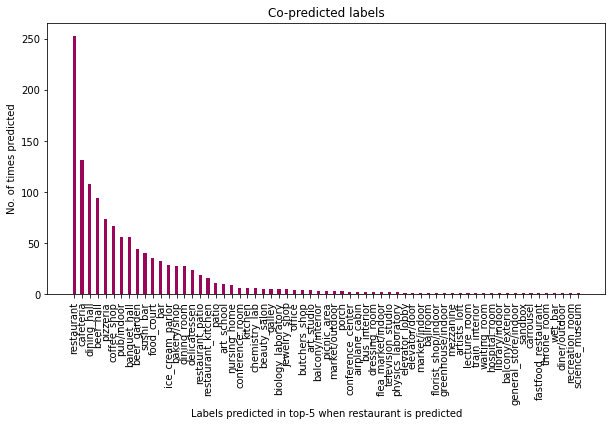

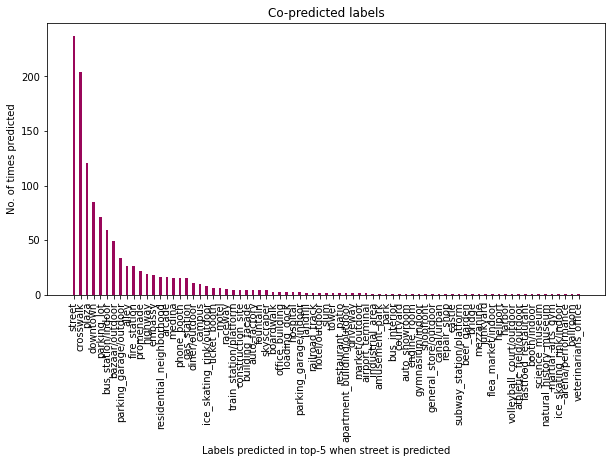

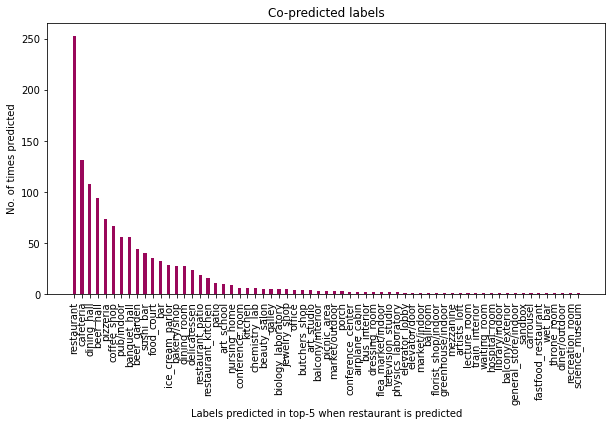

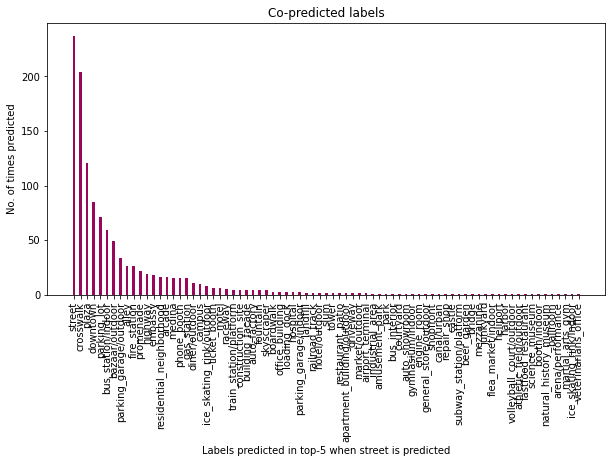

In [27]:
import numpy as np
import matplotlib.pyplot as plt
 
for i in [0,1]:
    data = sorted(statistics2[i].items(), key=lambda x: x[1], reverse=True)

    labels = [k1 for k1, k2 in data]
    values = [k2 for k1, k2 in data]
      
    fig = plt.figure(figsize = (10, 5))
    
    plt.bar(labels, values, color ='#99075A',
            width = 0.4)
    plt.xticks(labels, labels, rotation=90) 
    plt.xlabel("Labels predicted in top-5 when "+ places[i]+" is predicted")
    plt.ylabel("No. of times predicted")
    plt.title("Co-predicted labels")
    plt.show()

# 5 Explanation 

## 5.1 LIME
Χρησιμοποιήσαμε τον LIME σε διάφορες εικόνες, χωρίς ωστόσο να δούμε κάποιο pattern ή κάποια "εξήγηση" της απόφασης του classifier που βοηθάει το χρήστη να βγάλει σαφή επεξηγηματικά συμπεράσματα, καθώς είναι pixelwise μέθοδος. Επομένως οδηγούμαστε σε κάποια άλλη μέθοδο. 


In [28]:
explainer = lime_image.LimeImageExplainer()
#print((np.asarray(img) / 255.0).dtype)
img2 = np.asarray(img) / 255.0
#np.array([img2]).shape
#Image.fromarray((img2 * 255).astype(np.uint8))
explanation = explainer.explain_instance(np.array([img2])[0], predictor.classify, top_labels=2, hide_color=0, num_samples=100)

  0%|          | 0/100 [00:00<?, ?it/s]

(-0.5, 639.5, 423.5, -0.5)

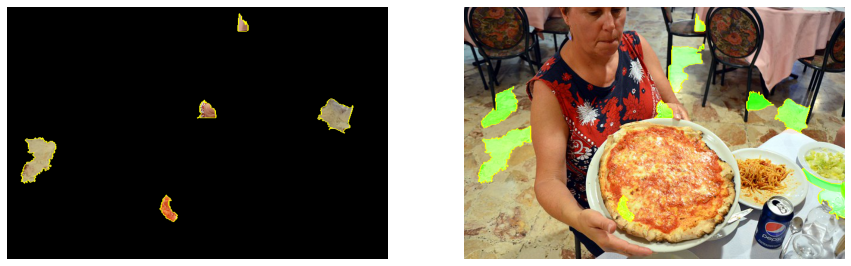

In [29]:
temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')
ax2.axis('off')

## 5.2 Vectorize entities found in image

Κωδικοποιούμε το dataset σε vectorized μορφή για να το χρησιμοποιήσουμε στις επόμενες μεθόδους. 

### 5.2.1 TFIDF

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

vectorizer = TfidfVectorizer(min_df = 10, max_features = 100000, analyzer = "word", ngram_range = (1,1), stop_words = 'english', lowercase = True)
vc = vectorizer.fit_transform(df["label_texts"])
vectorizer.get_feature_names_out()

array(['abstraction', 'act', 'animal', 'appliance', 'article', 'artifact',
       'backpack', 'bag', 'baggage', 'bench', 'bicycle', 'block', 'board',
       'book', 'bottle', 'bowl', 'broadcasting', 'bus', 'cake', 'canine',
       'canopy', 'car', 'carnivore', 'carrot', 'case', 'causal_agent',
       'cell_phone', 'chair', 'chordate', 'clock', 'clothing',
       'commodity', 'communicate', 'communication', 'computer', 'conduit',
       'consumer_goods', 'container', 'conveyance', 'couch', 'covering',
       'creation', 'crockery', 'cup', 'cutlery', 'cutter',
       'cutting_implement', 'device', 'digital_computer', 'dining_table',
       'discharge_pipe', 'dish', 'dog', 'domestic_animal', 'durables',
       'edge_tool', 'edible_fruit', 'entity', 'fire_hydrant', 'fixture',
       'food', 'fork', 'fruit', 'furnishing', 'furniture', 'garment',
       'handbag', 'herb', 'home_appliance', 'hydrant', 'implement',
       'instrument', 'instrumentality', 'interact', 'jar',
       'kitchen_appl

### 5.2.2 Count

In [31]:
from sklearn.feature_extraction.text import CountVectorizer
 
vectorizer = CountVectorizer()
vc = vectorizer.fit_transform(df["label_texts"])
vectorizer.get_feature_names_out()
pd.DataFrame(vc.todense(),columns=vectorizer.get_feature_names())

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,abstraction,act,advocate,animal,apple,appliance,article,artifact,backpack,bag,...,vehicle,vertebrate,vessel,visual_signal,ware,way,wheeled_vehicle,white_goods,whole,work
0,0,0,0,0,0,1,1,6,0,0,...,0,0,0,0,1,0,0,1,7,0
1,0,0,0,0,0,0,3,13,0,0,...,0,0,0,0,3,0,0,0,15,0
2,0,0,0,0,0,0,2,16,0,0,...,0,0,4,0,2,0,0,0,18,0
3,0,0,0,0,0,0,2,10,0,0,...,0,0,2,0,2,0,0,0,11,2
4,0,0,0,0,0,0,3,12,0,0,...,0,0,2,0,3,0,0,0,15,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,2,0,0,0,0,0,0,9,1,1,...,5,0,0,2,0,0,5,0,14,0
805,2,0,0,0,0,0,0,4,0,0,...,1,0,0,2,0,0,1,0,7,0
806,2,0,0,0,0,0,0,22,0,0,...,19,0,0,2,0,0,19,0,30,0
807,3,0,0,0,0,0,0,11,0,0,...,7,0,0,3,0,0,7,0,17,0


## 5.3 Decision Tree Classifier


Χρησιμοποιούμε τον Decision Tree Classifier με τον τρόπο που θα χρησιμοποιούσαμε τη μέθοδο Rule Matrix για τη δημιουργία human readable κανόνων που εξηγουν το αποτέλεσμα του classifier χρησιμοποιώντας ως features την ύπαρξη αντικειμένων στην εικόνα. Οι κανόνες αυτοί φαίνονται στην λογική πορεία που ακολουθούμε από την κορυφή προς τα φύλλα, στο εκτυπωμένο δέντρο. 


Συγκεκριμένα, για τη δημιουργία του dataset χρησιμοποιούμε τα αποτελέσματα του pretrained places classifier ως labels και τα αντικείμενα των εικόνων ως features. Με αυτό το data set κάνουμε train το decision tree, το οποίο εκτυπώνουμε. 

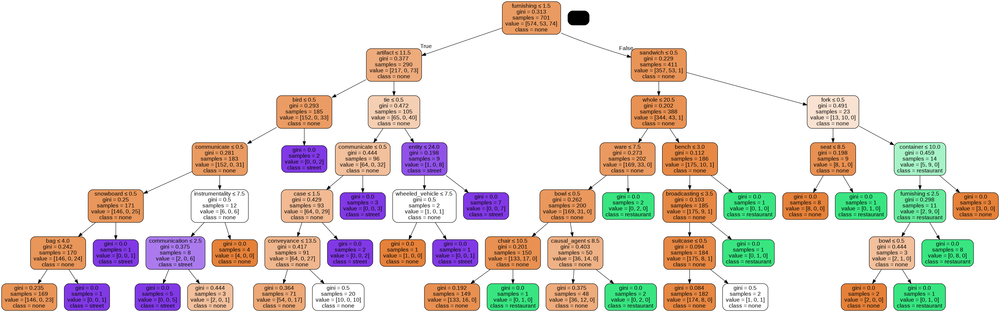

### 5.3.1 Generate prediction labels

In [32]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

for place_id in range(len(places)):
    img_ids = list(dataset[places[place_id]].coco.keys())
    for image_it in range(len(img_ids)):
        image_id = img_ids[image_it]
        image_url = dataset[places[place_id]].coco[image_id]['url']
        print (f"Image url: {image_url}")
        try:
            prediction = predictor.classifyWithLabels(image_url,1)[0][0]
            prediction = prediction.split('/', 1)[0]
        except Exception as e:
            print(e)
            continue
        print(prediction)
        df.loc[df['image_id'] == image_id,"label"] = prediction

Image url: http://farm3.staticflickr.com/2667/4444559660_ef50d6d70e_z.jpg
television_studio
Image url: http://farm5.staticflickr.com/4054/4420226879_2455493263_z.jpg
beer_garden
Image url: http://farm5.staticflickr.com/4026/4420227799_b0b075ee05_z.jpg
pub
Image url: http://farm3.staticflickr.com/2509/3922280340_d09af35238_z.jpg
restaurant
Image url: http://farm2.staticflickr.com/1420/543023771_46a976f4cf_z.jpg
general_store
Image url: http://farm9.staticflickr.com/8141/7640723682_e45033ac22_z.jpg
pizzeria
Image url: http://farm5.staticflickr.com/4101/5605039710_338397884f_z.jpg
pizzeria
Image url: http://farm6.staticflickr.com/5340/8892725336_a9ea265fa8_z.jpg
restaurant
Image url: http://farm6.staticflickr.com/5338/9135570933_cd53cb7f99_z.jpg
library
Image url: http://farm4.staticflickr.com/3677/9091983943_8260b4065a_z.jpg
restaurant
Image url: http://farm6.staticflickr.com/5518/9094361636_a194d14f41_z.jpg
beer_garden
Image url: http://farm4.staticflickr.com/3244/2609945215_4531801330_

In [33]:
df

,label_texts,image_id,label
0,entity physical_entity object whole artifact i...,214704.0,television_studio
1,entity physical_entity object whole artifact i...,311933.0,beer_garden
2,entity physical_entity object whole artifact i...,505700.0,pub
3,entity physical_entity object whole artifact i...,471245.0,restaurant
4,entity physical_entity object whole artifact i...,84391.0,general_store
...,...,...,...
804,entity physical_entity object whole artifact c...,145761.0,parking_garage
805,entity physical_entity object whole artifact c...,80090.0,bus_station
806,entity physical_entity object whole artifact c...,108701.0,downtown
807,entity physical_entity object whole artifact c...,114310.0,crosswalk


### 5.3.2 Create dataset

In [34]:
df_new = pd.concat([df,pd.DataFrame(vc.todense(), columns=vectorizer.get_feature_names())],axis=1)
del df_new["image_id"]
del df_new["label_texts"]
df_new = df_new.dropna()
df_new

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,label,abstraction,act,advocate,animal,apple,appliance,article,artifact,backpack,...,vehicle,vertebrate,vessel,visual_signal,ware,way,wheeled_vehicle,white_goods,whole,work
0,television_studio,0,0,0,0,0,1,1,6,0,...,0,0,0,0,1,0,0,1,7,0
1,beer_garden,0,0,0,0,0,0,3,13,0,...,0,0,0,0,3,0,0,0,15,0
2,pub,0,0,0,0,0,0,2,16,0,...,0,0,4,0,2,0,0,0,18,0
3,restaurant,0,0,0,0,0,0,2,10,0,...,0,0,2,0,2,0,0,0,11,2
4,general_store,0,0,0,0,0,0,3,12,0,...,0,0,2,0,3,0,0,0,15,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,parking_garage,2,0,0,0,0,0,0,9,1,...,5,0,0,2,0,0,5,0,14,0
805,bus_station,2,0,0,0,0,0,0,4,0,...,1,0,0,2,0,0,1,0,7,0
806,downtown,2,0,0,0,0,0,0,22,0,...,19,0,0,2,0,0,19,0,30,0
807,crosswalk,3,0,0,0,0,0,0,11,0,...,7,0,0,3,0,0,7,0,17,0


### 5.3.2 Train decision tree

In [35]:
from matplotlib import pyplot as plt
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree

X = df_new.loc[:, ~df_new.columns.isin(['label'])]
y = df_new.loc[:, df_new.columns.isin(['label'])]
y.loc[~y["label"].isin(["restaurant","street"]),"label"] = 'none'
y

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


,label
0,none
1,none
2,none
3,restaurant
4,none
...,...
804,none
805,none
806,none
807,none


In [36]:
clf = DecisionTreeClassifier(max_depth=6 ,criterion="gini")
clf = clf.fit(X,y)

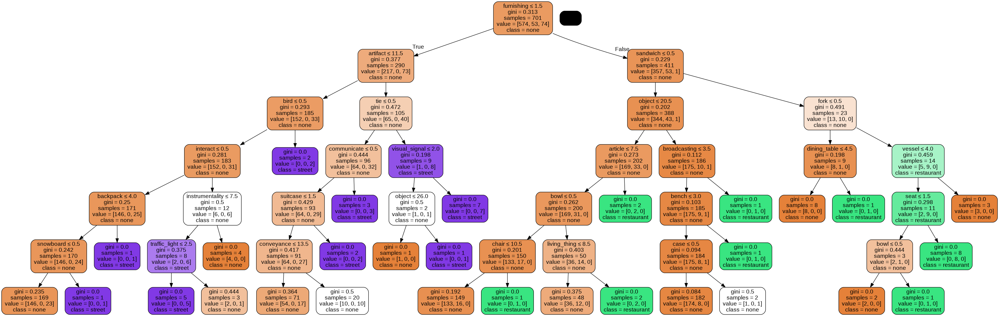

In [37]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns.values.tolist(),class_names=y["label"].unique())
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 5.4 Decision Tree Regressor

Χρησιμοποιούμε αντίστοιχη διαδικασία με αυτή του classifier (5.3), με τη διαφοροποίηση ότι αντί να χρησιμοποιούμε ως label τα places, αντιμετωπίζουμε το πρόβλημα ως πρόβλημα παλινδρόμησης για να προβλέψουμε την τιμή της πιθανότητας που εξάγει ο ταξινομητής για ένα συγκεκριμένο place (στην περίπτωσή μας: 'restaurant' ή 'street'). Για την αξιολόγηση της πρόβλεψης του ταξινομητή χρησιμοποιούμε δύο μετρικές, όπως φαίνεται παρακάτω. 

Για το restaurant

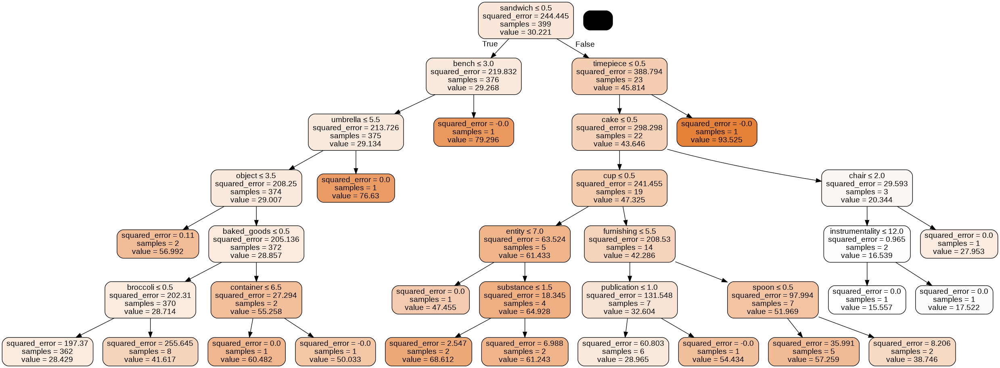

Για το street

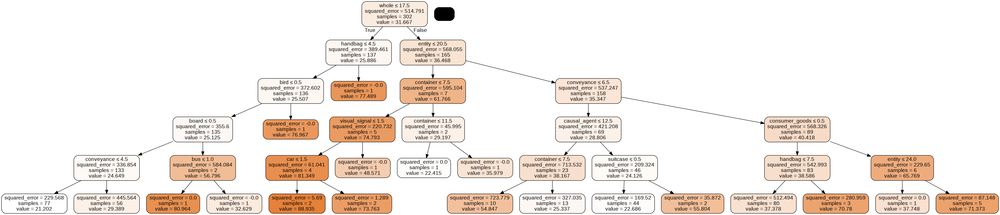

#### 5.4.1 Obtain probability of specific place

Στην πρώτη, τα labels είναι η πιθανότητα που βγάζει ο ταξινομητής για το target place.

In [39]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

for place_id in [0,1]:
    img_ids = list(dataset[places[place_id]].coco.keys())
    for image_it in range(len(img_ids)):
        image_id = img_ids[image_it]
        image_url = dataset[places[place_id]].coco[image_id]['url']

        print (f"Image url: {image_url}")
        prob = 0
        try:
            img = read_image_from_url(image_url)
            print("Probability of being a: "+ places[place_id])
            probs = predictor.classifyWithLabels(image_url)
            for p in probs:
                if p[0] == places[place_id]:
                    prob = p[1]
            print(prob)
            df.loc[df['image_id'] == image_id,places[place_id]] = prob * 100
        except Exception as e:
            print(e)
            continue

df

Image url: http://farm3.staticflickr.com/2667/4444559660_ef50d6d70e_z.jpg
Probability of being a: restaurant
0
Image url: http://farm5.staticflickr.com/4054/4420226879_2455493263_z.jpg
Probability of being a: restaurant
0
Image url: http://farm5.staticflickr.com/4026/4420227799_b0b075ee05_z.jpg
Probability of being a: restaurant
0.01969696208834648
Image url: http://farm3.staticflickr.com/2509/3922280340_d09af35238_z.jpg
Probability of being a: restaurant
0.3183800280094147
Image url: http://farm2.staticflickr.com/1420/543023771_46a976f4cf_z.jpg
Probability of being a: restaurant
0
Image url: http://farm9.staticflickr.com/8141/7640723682_e45033ac22_z.jpg
Probability of being a: restaurant
0.0076934113167226315
Image url: http://farm5.staticflickr.com/4101/5605039710_338397884f_z.jpg
Probability of being a: restaurant
0.2155156135559082
Image url: http://farm6.staticflickr.com/5340/8892725336_a9ea265fa8_z.jpg
Probability of being a: restaurant
0.2625970244407654
Image url: http://farm6.

KeyboardInterrupt: ignored

Στη δεύτερη, διαφοροποιούμε κάπως το αποτέλεσμα που βγάζει ο classifier για τα labels. Συγκεκριμένα προσπαθούμε να ποσοτικοποιήσουμε το πόσο κοντά στο ζητούμενο είναι τα πρώτα 5 labels που βγάζει ο ταξινομητής. Συγκεκριμένα χρησιμοποιούμε τον παρακάτω σταθμισμένο μέσο όρο σαν score της παλινδρόμησης:

$$P(i,place) = \frac{\sum( \pi(label) \times similarity (place,label) )}{\sum( \pi(label))}$$

Με αυτό τον τρόπο κοιτάμε πόσο κοντά έχει πέσει ο ταξινομητής σημασιολογικά, λαμβάνοντας υπόψιν όχι μόνο αν έχει προβλέψει το ακριβές αποτέλεσμα, αλλά και αν η πρόβλεψή του είναι σωστή εννοιολογικά.

In [40]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

for place_id in [0,1]:
    img_ids = list(dataset[places[place_id]].coco.keys())
    for image_it in range(len(img_ids)):
        image_id = img_ids[image_it]
        image_url = dataset[places[place_id]].coco[image_id]['url']

        print (f"Image url: {image_url}")
        try:
            img = read_image_from_url(image_url)
        except Exception as e:
            print(e)
        print("Probability of being a: "+ places[place_id])
        try:
            preds = predictor.classifyWithLabels(image_url)
            w_all = 0
            pred = 0
            for p in preds:
                sim = -1
                pp = p[0].split('/', 1)[0]
                if len(wn.synsets(p[0].split('/', 1)[0])) != 0:
                    sim = wn.synsets(places[place_id])[0].path_similarity(wn.synsets(pp)[0])
                else:
                    print("No synsets were found for: "+pp)
                    print("Trying individuals...")
                    indivs = pp.split('_')
                    for i in indivs:
                        if len(wn.synsets(i)) != 0:
                            sim = wn.synsets(places[place_id])[0].path_similarity(wn.synsets(i)[0])
                            print("Found for: "+i)
                            break
                if sim == -1:
                    continue
                w_all += p[1]
                pred += sim * p[1]
            pred /= w_all
            print(pred)
        except Exception as e:
            print(e)
            continue
        df.loc[df['image_id'] == image_id,places[place_id]] = pred * 100
df

Image url: http://farm3.staticflickr.com/2667/4444559660_ef50d6d70e_z.jpg
Probability of being a: restaurant
No synsets were found for: television_studio
Trying individuals...
Found for: television
0.1099192136250459
Image url: http://farm5.staticflickr.com/4054/4420226879_2455493263_z.jpg
Probability of being a: restaurant
No synsets were found for: ice_cream_parlor
Trying individuals...
Found for: ice
0.17526738177728693
Image url: http://farm5.staticflickr.com/4026/4420227799_b0b075ee05_z.jpg
Probability of being a: restaurant
No synsets were found for: restaurant_patio
Trying individuals...
Found for: restaurant
0.26756635783110055
Image url: http://farm3.staticflickr.com/2509/3922280340_d09af35238_z.jpg
Probability of being a: restaurant
0.5443439016293266
Image url: http://farm2.staticflickr.com/1420/543023771_46a976f4cf_z.jpg
Probability of being a: restaurant
0.2032951084259892
Image url: http://farm9.staticflickr.com/8141/7640723682_e45033ac22_z.jpg
Probability of being a: res

,label_texts,image_id,label,restaurant,street
0,entity physical_entity object whole artifact i...,214704.0,television_studio,10.991921,NaN
1,entity physical_entity object whole artifact i...,311933.0,beer_garden,17.526738,NaN
2,entity physical_entity object whole artifact i...,505700.0,pub,26.756636,NaN
3,entity physical_entity object whole artifact i...,471245.0,restaurant,54.434390,NaN
4,entity physical_entity object whole artifact i...,84391.0,general_store,20.329511,NaN
...,...,...,...,...,...
804,entity physical_entity object whole artifact c...,145761.0,parking_garage,NaN,7.581845
805,entity physical_entity object whole artifact c...,80090.0,bus_station,NaN,10.564907
806,entity physical_entity object whole artifact c...,108701.0,downtown,NaN,18.330371
807,entity physical_entity object whole artifact c...,114310.0,crosswalk,NaN,34.783330


In [41]:
place = 'patio'
wn.synsets(place.split('/', 1)[0])
"ice_cream_patio".split("_")

['ice', 'cream', 'patio']

### 5.4.2 Create dataset

In [42]:
df_restaurant = pd.concat([df,pd.DataFrame(vc.todense(), columns=vectorizer.get_feature_names())],axis=1)
df_street = pd.concat([df,pd.DataFrame(vc.todense(), columns=vectorizer.get_feature_names())],axis=1)
del df_restaurant["street"]
del df_street["restaurant"]
del df_restaurant["image_id"]
del df_restaurant["label_texts"]
del df_street["image_id"]
del df_street["label_texts"]
df_restaurant = df_restaurant.dropna()
df_street = df_street.dropna()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [43]:
df_restaurant

,label,restaurant,abstraction,act,advocate,animal,apple,appliance,article,artifact,...,vehicle,vertebrate,vessel,visual_signal,ware,way,wheeled_vehicle,white_goods,whole,work
0,television_studio,10.991921,0,0,0,0,0,1,1,6,...,0,0,0,0,1,0,0,1,7,0
1,beer_garden,17.526738,0,0,0,0,0,0,3,13,...,0,0,0,0,3,0,0,0,15,0
2,pub,26.756636,0,0,0,0,0,0,2,16,...,0,0,4,0,2,0,0,0,18,0
3,restaurant,54.434390,0,0,0,0,0,0,2,10,...,0,0,2,0,2,0,0,0,11,2
4,general_store,20.329511,0,0,0,0,0,0,3,12,...,0,0,2,0,3,0,0,0,15,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
457,art_school,20.397556,0,0,0,0,0,0,7,14,...,0,0,0,0,7,0,0,0,16,0
458,nursing_home,16.660261,0,0,0,0,0,0,0,7,...,0,0,0,0,0,0,0,0,15,0
459,recreation_room,21.258873,0,0,0,0,0,0,3,17,...,0,0,0,0,3,0,0,0,28,0
460,banquet_hall,21.718585,0,0,0,0,0,0,13,25,...,0,0,2,0,13,0,0,0,42,0


In [44]:
df_street

,label,street,abstraction,act,advocate,animal,apple,appliance,article,artifact,...,vehicle,vertebrate,vessel,visual_signal,ware,way,wheeled_vehicle,white_goods,whole,work
462,street,89.308762,2,0,0,1,0,0,0,9,...,5,1,0,2,0,0,5,0,19,0
463,ticket_booth,9.721643,2,0,0,0,0,0,0,14,...,4,0,0,2,0,0,4,0,27,0
464,promenade,26.804855,4,0,0,0,0,0,0,7,...,1,0,0,4,0,0,1,0,13,0
465,bus_station,15.964488,1,0,0,0,0,0,0,7,...,4,0,0,1,0,0,4,0,13,0
466,downtown,19.661594,3,0,0,0,0,0,0,8,...,3,0,0,3,0,0,3,0,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,parking_garage,7.581845,2,0,0,0,0,0,0,9,...,5,0,0,2,0,0,5,0,14,0
805,bus_station,10.564907,2,0,0,0,0,0,0,4,...,1,0,0,2,0,0,1,0,7,0
806,downtown,18.330371,2,0,0,0,0,0,0,22,...,19,0,0,2,0,0,19,0,30,0
807,crosswalk,34.783330,3,0,0,0,0,0,0,11,...,7,0,0,3,0,0,7,0,17,0


### 5.4.3 Train decision tree

In [45]:
from sklearn.tree import DecisionTreeRegressor 
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

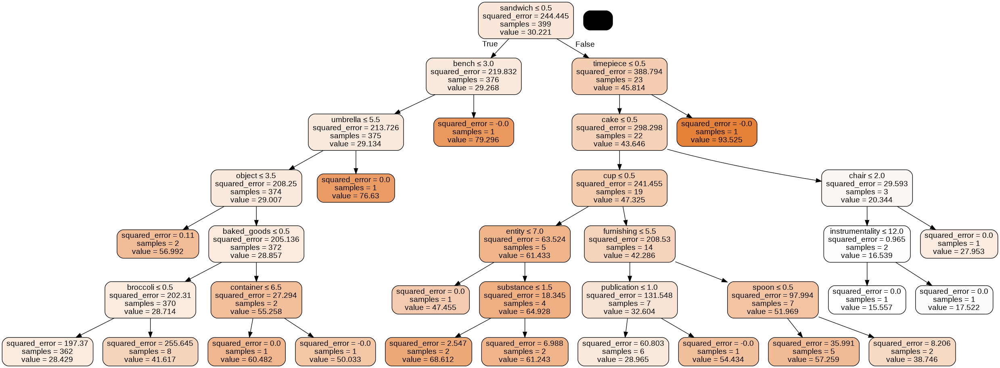

In [46]:
place = "restaurant"
X = df_restaurant.loc[:, ~df_restaurant.columns.isin([place, 'label'])]
y = df_restaurant.loc[:, df_restaurant.columns.isin([place])]
regressor = DecisionTreeRegressor(random_state = 0, max_depth=6) 
regressor.fit(X, y)
dot_data = StringIO()
export_graphviz(regressor, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns.values.tolist())
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

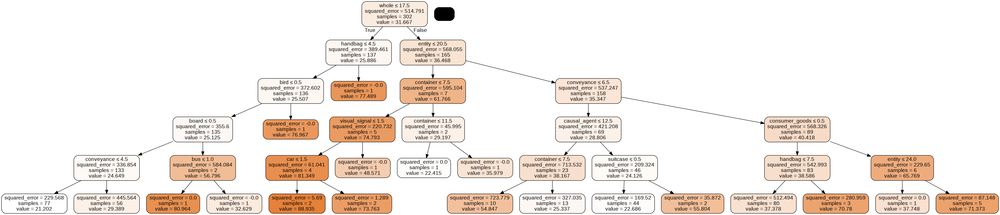

In [47]:
place = "street"
X = df_street.loc[:, ~df_street.columns.isin([place, 'label'])]
y = df_street.loc[:, df_street.columns.isin([place])]
regressor = DecisionTreeRegressor(random_state = 0, max_depth=5) 
regressor.fit(X, y)
dot_data = StringIO()
export_graphviz(regressor, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns.values.tolist())
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 5.5 Grad-CAM  (Saliency maps)


Grad-CAM αντιστοιχεί στο Gradient-weighted Class Activation Map. Στηρίζεται στο gradient του νευρωνικού. Η υλοποίηση βρίσκεται στην ενότητα 4.1 και η λίστα με τις εικόνες προκύπτει από την ενότητα 4.2.  

In [51]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

for place_id in [0,1]:
  ll = prob_correct_list[places[place_id]]
  for image_url, Image_id in ll:
    #image_id = list(dataset[places[place_id]].coco.keys())[image_it]
    #image_url = dataset[places[place_id]].coco[image_id]['url']
    print (f"Image url: {image_url}")
    print("Predictions")
    path = predictor.classifyWIthGradCam(image_url, places[place_id], Image_id)

Streaming output truncated to the last 5000 lines.
0.194 -> delicatessen
0.191 -> bakery/shop
0.116 -> ice_cream_parlor
0.095 -> restaurant
0.093 -> pizzeria
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "/heatmap_restaurant_487775.jpg"
Image url: http://farm3.staticflickr.com/2496/4242791028_c575a81293_z.jpg
Predictions
--SCENE CATEGORIES:http://farm3.staticflickr.com/2496/4242791028_c575a81293_z.jpg
--SCENE ATTRIBUTES:
0.184 -> beer_hall
0.175 -> pub/indoor
0.068 -> pizzeria
0.051 -> banquet_hall
0.049 -> restaurant
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "/heatmap_restaurant_86654.jpg"
Image url: http://farm3.staticflickr.com/2775/4242800908_9649737483_z.jpg
Predictions
--SCENE CATEGORIES:http://farm3.staticflickr.com/2775/4242800908_9649737483_z.jpg
--SCENE ATTRIBUTES:
0.

### 5.5.1 Restaurant Examples

Γενικά παρατηρούμε ότι ο places classidier επικεντρώνεται σε χαρακτηριστικά όπως φαγητά, ποτήρια και μπουκάλια κρασιού, κλπ. Εξωτερικοί χώροι που εντοπίζονται οδηγούν σε άλλους χαρακτηρισμούς αντί του restaurant, που θα μπορούσαν να συμπεριληφθούν στην ευρύτερη έννοια. Φαίνεται ωστόσο ότι εικόνες που δεν θα έπρεπε να χαρακτηρίζονται ως restaurant υπάρχουν στο data set. Αυτές αφαιρέθηκαν από το data set στην ενότητα 4.2. Τα αποτελέσματα του GradCAM ωστόσο εξαρτώνται από την τρέχουσα εικόνα κάθε φορά επομένως δεν θα προχωρήσουμε σε εκ νέου μελέτη για το μικρότερο data set. 



```
Image url: http://farm7.staticflickr.com/6082/6149985433_4b2d2ff852_z.jpg
Predictions
--SCENE CATEGORIES:http://farm7.staticflickr.com/6082/6149985433_4b2d2ff852_z.jpg
--SCENE ATTRIBUTES:
0.381 -> coffee_shop
0.096 -> restaurant_patio
0.086 -> beer_garden
0.052 -> ice_cream_parlor
0.047 -> patio
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "heatmap_restaurant_1144.jpg"
```



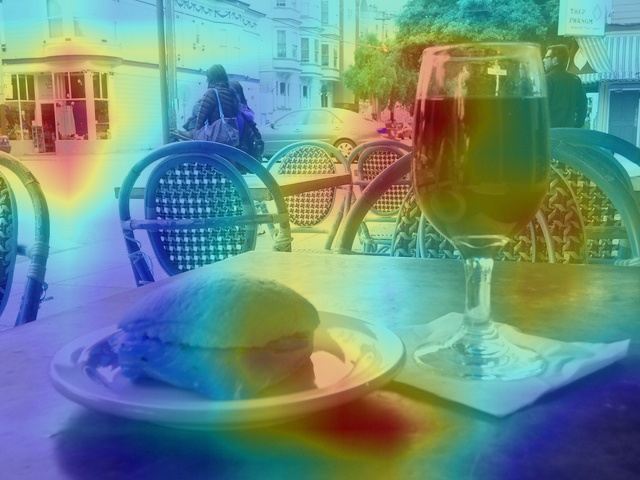



```
Image url: http://farm1.staticflickr.com/46/168590962_08529ea25d_z.jpg
Predictions
--SCENE CATEGORIES:http://farm1.staticflickr.com/46/168590962_08529ea25d_z.jpg
--SCENE ATTRIBUTES:
0.174 -> art_school
0.150 -> beauty_salon
0.081 -> classroom
0.033 -> chemistry_lab
0.033 -> biology_laboratory
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "heatmap_restaurant_340727.jpg"
```



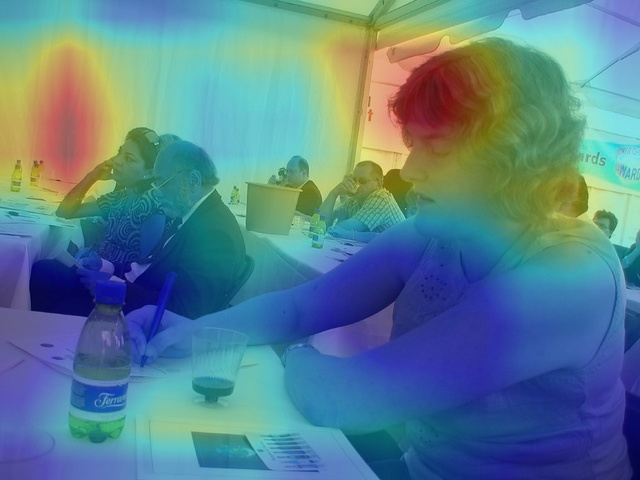



```
Predictions
--SCENE CATEGORIES:http://farm4.staticflickr.com/3783/9164513136_b4d37e2a56_z.jpg
--SCENE ATTRIBUTES:
0.104 -> sushi_bar
0.098 -> library/indoor
0.073 -> food_court
0.070 -> restaurant
0.054 -> fastfood_restaurant
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "heatmap_restaurant_382278.jpg"
```



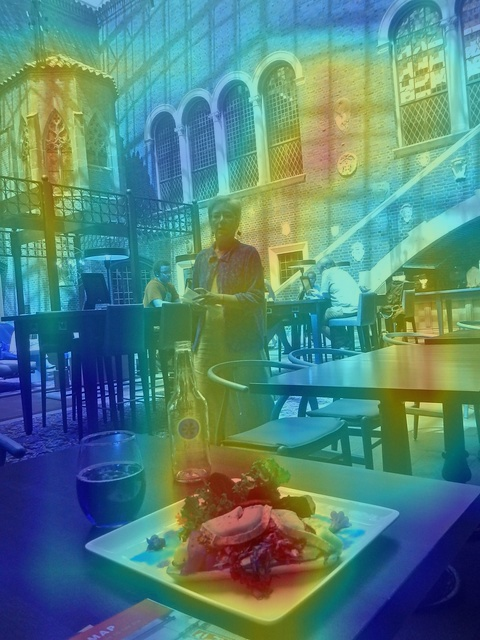

### 5.5.2 Street Examples

Για τον χαρακτηρισμό μιας εικόνας ως street φαίνεται πως παίζουν ρόλο χαρακτηριστικά όπως φανάρια και πινακίδες. Κατά κύριο λόγο, το μεγαλύτερο ποσοστό των εικόνων που θα χαρακτηριστούν ως street (όχι απαραίτητα με το μεγαλύτερο ποσοστό) έχουν τουλάχιστον ένα από αυτά τα χαρακτηριστικά, τα οποία φαίνεται πως κατά τον GradCAM έχουν μεγαλύτερη σημασία από τα αμάξια.



```

Image url: http://farm5.staticflickr.com/4033/4517423299_74db661e94_z.jpg
Predictions
--SCENE CATEGORIES:http://farm5.staticflickr.com/4033/4517423299_74db661e94_z.jpg
--SCENE ATTRIBUTES:
0.254 -> crosswalk
0.178 -> street
0.073 -> plaza
0.055 -> phone_booth
0.055 -> embassy
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "heatmap_street_410590.jpg"
```




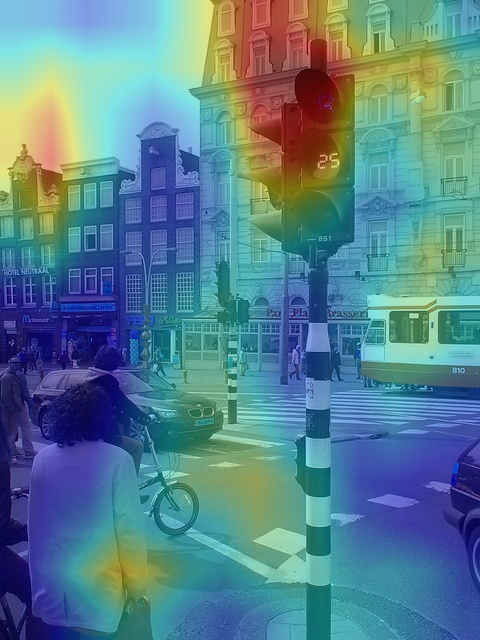



```
Image url: http://farm9.staticflickr.com/8322/7984508213_45d75803fa_z.jpg
Predictions
--SCENE CATEGORIES:http://farm9.staticflickr.com/8322/7984508213_45d75803fa_z.jpg
--SCENE ATTRIBUTES:
0.132 -> street
0.109 -> medina
0.105 -> arcade
0.090 -> bazaar/outdoor
0.037 -> bazaar/indoor
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "heatmap_street_319712.jpg"
```



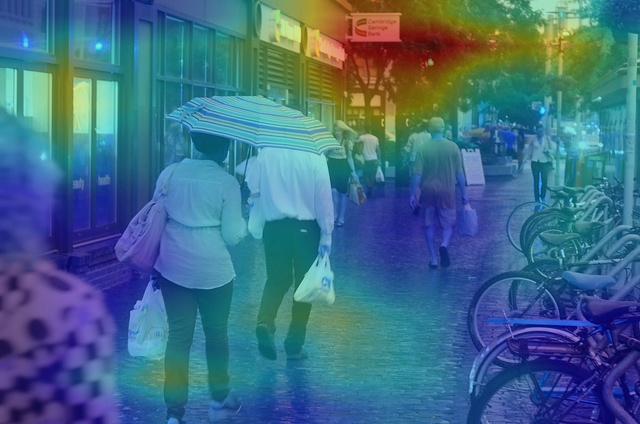


```
Image url: http://farm9.staticflickr.com/8068/8238572936_c998939af9_z.jpg
Predictions
--SCENE CATEGORIES:http://farm9.staticflickr.com/8068/8238572936_c998939af9_z.jpg
--SCENE ATTRIBUTES:
0.221 -> street
0.058 -> crosswalk
0.041 -> phone_booth
0.028 -> bazaar/outdoor
0.026 -> playground
-- ATTRIBUTES:
no horizon, cloth, man-made, enclosed area, eating, socializing, natural light, working, congregating
Class activation map is saved in "heatmap_street_314708.jpg"

```




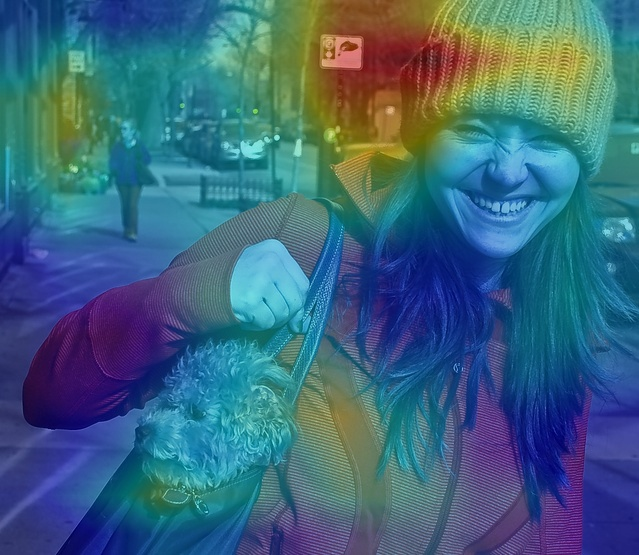

# 6 Explanation for smaller data set (2nd round)

Από τις εικόνες απορρίπτουμε αυτές που δεν έχουν στις πέντε πρώτες θέσεις του prediction τις ετικέτες restaurant ή street. Θεωρούμε πως ο classifier είναι αρκετά καλός για να "ξεσκαρτάρουμε" τελειώς άσχετες εικόνες, καθώς δεν βοηθάν στην σύγκριση των αποτελέσματων του classifier με τον δικό μας. Αυτή η λίστα προέκυψε από την ενότητα 4.2.


## 6.1 Repeat steps of sections 3, 5.2

In [52]:
onto = get_ontology('http://coco_οntology_rs_small/')

## ids των εικόνων
ids = {}

for p in places:
    ids[p] = [id for url, id in prob_correct_list[p]]

df_2 = pd.DataFrame()
df_2

with onto:
  ## Ορισμός εννοιών για εικόνες και αντικείμενα
  class Image(Thing):
    namespace=onto
    pass

  class DepictedObject(Thing):
    namespace=onto
    pass

  ## Ορισμός ρόλου "hasObject" (ποιες εικόνες περιέχουν ποια αντικείμενα)
  class hasObject(Image>>DepictedObject):
    namespace=onto
    pass
  
  tdataset = {}
  
  ## Για κάθε εικόνα
  for p in places:
      tdataset[p] = {}
      for im_id in ids[p]:
        ## Δημιουργία individual τύπου "Image"
        im = onto['Image'](str(im_id))
        obj_list = dataset[p].coco[im_id]['label_texts']

        tdataset[p][im_id] = {}
        tdataset[p][im_id]['label_texts'] = ""
        tdataset[p][im_id]['image_id'] = im_id
        
        ## Για κάθε αντικείμενο στην εικόνα:
        for obj_name in obj_list:
      
            ## Εύρεση πρώτου synset στο wordnet
            synsets = wn.synsets(obj_name)

            if len(synsets)<1:
                continue
      
            ## Δημιουργία individual τύπου "Object"
            obj = onto['DepictedObject']()

            ## Σύνδεση της εικόνας με το αντικείμενο μέσω του ρόλου hasObject
            im.hasObject.append(obj)

            synset = wn.synsets(obj_name)[0].name()
      
            ## Αν υπάρχει η αντίστοιχη έννοια στη γνώση
            if onto[synset] in onto.classes():
                ## Ορίζουμε το αντικείμενο obj ως τύπου "synset"
                obj.is_a.append(onto[synset])

                hyper = lambda s:s.hypernyms()
                hypers = [s.name() for s in list(wn.synset(synset).closure(hyper))]
                hypers = reversed(hypers)
                father = Thing
                for h in hypers:
                    father = onto[h]
                    tdataset[p][im_id]['label_texts'] += h.split('.', 1)[0]+" "

            ## Αν δεν υπάρχει η αντίστοιχη έννοια στη γνώση, την ορίζουμε, μαζί με τις υπερέννοιές της
            else:
                ## Εύρεση υπερώνυμων
                hyper = lambda s:s.hypernyms()
                hypers = [s.name() for s in list(wn.synset(synset).closure(hyper))]
                hypers = reversed(hypers)
                ## Ορισμός ιεραρχίας εννοιών
                father = Thing
                for h in hypers:
                    if onto[h] not in onto.classes():
                        with onto:
                            cl = types.new_class(h,(father,))
                    father = onto[h]
                    print(onto[h])
                    tdataset[p][im_id]['label_texts'] += h.split('.', 1)[0]+" "
                if onto[synset] not in onto.classes():
                    with onto:
                        cl = types.new_class(synset,(father,))
                ## Ορίζουμε το αντικείμενο obj ως τύπου "synset"
                with onto:
                    obj.is_a.append(onto[synset])
            
            tdataset[p][im_id]['label_texts'] += obj_name.replace(" ","_")+" "
        df_2 = df_2.append(tdataset[p][im_id], ignore_index = True)

  ## Αποθηκεύουμε την οντολογία
  onto.save('coco_οnto_rs_small.nt',format='ntriples')

coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.container.n.01
coco_οntology_rs_small.vessel.n.03
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.furnishing.n.02
coco_οntology_rs_small.furniture.n.01
coco_οntology_rs_small.seat.n.03
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.living_thing.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.organism.n.01
coco_οntology_rs_small.causal_agent.n.01
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.container.n.01
coco_οntology_rs_small.vessel.n.03
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.furnishing.n.02
coco_οntology_rs_small.furniture.n.01
coco_οntology_rs_small.seat.n.03
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.container.n.01
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.device.n.01
coco_οntology_rs_small.instrument.n.01
coco_οntology_rs_small.measuring_instrument.n.01
coco_οntology_rs_small.timepiece.n.01
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.device.n.01
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.container.n.01
coco_οntology_rs_small.vessel.n.03
coco_οntology_rs_small.jar.n.01
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntolog

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('physical_entity.n.01') at depth 10
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.covering.n.02
coco_οntology_rs_small.protective_covering.n.01
coco_οntology_rs_small.shelter.n.02
coco_οntology_rs_small.canopy.n.03
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.living_thing.n.01
coco_οntology_rs_small.organism.n.01
coco_οntology_rs_small.animal.n.01
coco_οntology_rs_small.chordate.n.01
coco_οntology_rs_small.vertebrate.n.01
coco_οntology_rs_small.mammal.n.01
coco_οntology_rs_small.placental.n.01
coco_οntology_rs_small.carnivore.n.01
coco_οntology_rs_small.feline.n.01


/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.chordate.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.vertebrate.n.01
coco_οntology_rs_small.living_thing.n.01
coco_οntology_rs_small.mammal.n.01
coco_οntology_rs_small.organism.n.01
coco_οntology_rs_small.placental.n.01
coco_οntology_rs_small.animal.n.01
coco_οntology_rs_small.carnivore.n.01
coco_οntology_rs_small.domestic_animal.n.01
coco_οntology_rs_small.canine.n.02
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.fixture.n.01
coco_οntology_rs_small.plumbing_fixture.n.01


/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.conveyance.n.03
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.vehicle.n.01
coco_οntology_rs_small.container.n.01
coco_οntology_rs_small.wheeled_vehicle.n.01
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.living_thing.n.01
coco_οntology_rs_small.organism.n.01
coco_οntology_rs_small.animal.n.01
coco_οntology_rs_small.chordate.n.01
coco_οntology_rs_small.vertebrate.n.01
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.commodity.n.01
coco_οntology_rs_small.consumer_goods.n.01
coco_οntolo

/usr/local/lib/python3.7/dist-packages/nltk/corpus/reader/wordnet.py:599: UserWarning: Discarded redundant search for Synset('artifact.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):


coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.conveyance.n.03
coco_οntology_rs_small.instrumentality.n.03
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.vehicle.n.01
coco_οntology_rs_small.container.n.01
coco_οntology_rs_small.sheet.n.06
coco_οntology_rs_small.wheeled_vehicle.n.01
coco_οntology_rs_small.board.n.03
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.artifact.n.01
coco_οntology_rs_small.sheet.n.06
coco_οntology_rs_small.board.n.03
coco_οntology_rs_small.entity.n.01
coco_οntology_rs_small.physical_entity.n.01
coco_οntology_rs_small.object.n.01
coco_οntology_rs_small.whole.n.02
coco_οntology_rs_small.living_thing.n.01
coco_οntology_rs_small.organism.n.01
coco_οntology_rs_small.animal.n.01
coco_οntology_rs_small.chordate.

In [53]:
df_2

,label_texts,image_id
0,entity physical_entity object whole artifact i...,505700.0
1,entity physical_entity object whole artifact i...,471245.0
2,entity physical_entity object whole artifact i...,285891.0
3,entity physical_entity object whole artifact i...,160940.0
4,entity physical_entity object whole artifact i...,348580.0
...,...,...
485,object whole entity living_thing physical_enti...,420425.0
486,entity physical_entity object whole artifact c...,331315.0
487,object whole entity living_thing physical_enti...,41459.0
488,entity physical_entity object whole artifact c...,108701.0


In [54]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

vectorizer = TfidfVectorizer(min_df = 10, max_features = 100000, analyzer = "word", ngram_range = (1,1), stop_words = 'english', lowercase = True)
vc = vectorizer.fit_transform(df_2["label_texts"])
vectorizer.get_feature_names_out()

array(['animal', 'article', 'artifact', 'backpack', 'bag', 'baggage',
       'bench', 'bicycle', 'block', 'board', 'book', 'bottle', 'bowl',
       'bus', 'cake', 'canopy', 'car', 'case', 'causal_agent', 'chair',
       'chordate', 'clock', 'clothing', 'commodity', 'consumer_goods',
       'container', 'conveyance', 'couch', 'covering', 'creation',
       'crockery', 'cup', 'cutlery', 'cutter', 'cutting_implement',
       'device', 'dish', 'edge_tool', 'entity', 'food', 'fork',
       'furnishing', 'furniture', 'garment', 'handbag', 'implement',
       'instrument', 'instrumentality', 'jar', 'knife', 'living_thing',
       'mammal', 'matter', 'measuring_instrument', 'motor_vehicle',
       'motorcycle', 'natural_object', 'neckwear', 'nutriment', 'object',
       'organism', 'person', 'physical_entity', 'pizza', 'placental',
       'plant_organ', 'plant_part', 'product', 'propelled_vehicle',
       'protective_covering', 'public_transport', 'publication',
       'sandwich', 'seat', 'sel

In [55]:
from sklearn.feature_extraction.text import CountVectorizer
 
vectorizer = CountVectorizer()
vc = vectorizer.fit_transform(df_2["label_texts"])
vectorizer.get_feature_names_out()
pd.DataFrame(vc.todense(),columns=vectorizer.get_feature_names())

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,animal,apple,appliance,article,artifact,backpack,bag,baggage,baked_goods,banana,...,vascular_plant,vase,vehicle,vertebrate,vessel,ware,wheeled_vehicle,white_goods,whole,work
0,0,0,0,2,15,0,0,0,0,0,...,0,0,0,0,4,2,0,0,17,0
1,0,0,0,2,9,0,0,0,0,0,...,0,0,0,0,2,2,0,0,10,2
2,0,0,0,1,8,0,0,0,0,0,...,0,0,0,0,0,1,0,0,9,0
3,0,0,0,4,19,0,0,0,0,0,...,0,0,0,0,11,4,0,0,23,0
4,0,0,0,8,19,0,0,0,0,0,...,0,0,0,0,2,8,0,0,23,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,0,0,0,0,9,0,0,2,0,0,...,0,0,3,0,0,0,3,0,18,0
486,0,0,0,0,22,3,3,0,0,0,...,0,0,16,0,0,0,16,0,31,0
487,0,0,0,0,14,1,1,0,0,0,...,0,0,12,0,0,0,12,0,18,0
488,0,0,0,0,22,0,0,0,0,0,...,0,0,19,0,0,0,19,0,30,0


## 6.2 Repeat steps of section 5.3 (Decision Tree Classifier)

Βλέπουμε ότι τώρα που το data set έχει μικρύνει έχουν αλλάξει και το δέντρο αποφάσεων (δηλαδή οι κανόνες που εξηγούν τις αποφάσεις του places classifier). 

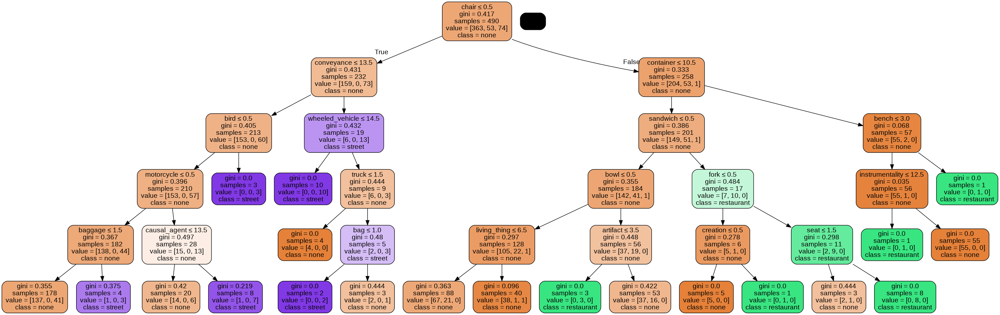

In [56]:
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

for place_id in range(len(places)):
    img_ids = list(dataset[places[place_id]].coco.keys())
    for image_it in range(len(img_ids)):
        image_id = img_ids[image_it]
        image_url = dataset[places[place_id]].coco[image_id]['url']
        print (f"Image url: {image_url}")
        try:
            prediction = predictor.classifyWithLabels(image_url,1)[0][0]
            prediction = prediction.split('/', 1)[0]
        except Exception as e:
            print(e)
            continue
        print(prediction)
        df_2.loc[df_2['image_id'] == image_id,"label"] = prediction

Image url: http://farm3.staticflickr.com/2667/4444559660_ef50d6d70e_z.jpg
television_studio
Image url: http://farm5.staticflickr.com/4054/4420226879_2455493263_z.jpg
beer_garden
Image url: http://farm5.staticflickr.com/4026/4420227799_b0b075ee05_z.jpg
pub
Image url: http://farm3.staticflickr.com/2509/3922280340_d09af35238_z.jpg
restaurant
Image url: http://farm2.staticflickr.com/1420/543023771_46a976f4cf_z.jpg
general_store
Image url: http://farm9.staticflickr.com/8141/7640723682_e45033ac22_z.jpg
pizzeria
Image url: http://farm5.staticflickr.com/4101/5605039710_338397884f_z.jpg
pizzeria
Image url: http://farm6.staticflickr.com/5340/8892725336_a9ea265fa8_z.jpg
restaurant
Image url: http://farm6.staticflickr.com/5338/9135570933_cd53cb7f99_z.jpg
library
Image url: http://farm4.staticflickr.com/3677/9091983943_8260b4065a_z.jpg
restaurant
Image url: http://farm6.staticflickr.com/5518/9094361636_a194d14f41_z.jpg
beer_garden
Image url: http://farm4.staticflickr.com/3244/2609945215_4531801330_

In [57]:
df_new_2 = pd.concat([df_2,pd.DataFrame(vc.todense(), columns=vectorizer.get_feature_names())],axis=1)
del df_new_2["image_id"]
del df_new_2["label_texts"]
df_new_2 = df_new_2.dropna()
df_new_2

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,label,animal,apple,appliance,article,artifact,backpack,bag,baggage,baked_goods,...,vascular_plant,vase,vehicle,vertebrate,vessel,ware,wheeled_vehicle,white_goods,whole,work
0,pub,0,0,0,2,15,0,0,0,0,...,0,0,0,0,4,2,0,0,17,0
1,restaurant,0,0,0,2,9,0,0,0,0,...,0,0,0,0,2,2,0,0,10,2
2,pizzeria,0,0,0,1,8,0,0,0,0,...,0,0,0,0,0,1,0,0,9,0
3,pizzeria,0,0,0,4,19,0,0,0,0,...,0,0,0,0,11,4,0,0,23,0
4,restaurant,0,0,0,8,19,0,0,0,0,...,0,0,0,0,2,8,0,0,23,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,ice_skating_rink,0,0,0,0,9,0,0,2,0,...,0,0,3,0,0,0,3,0,18,0
486,crosswalk,0,0,0,0,22,3,3,0,0,...,0,0,16,0,0,0,16,0,31,0
487,crosswalk,0,0,0,0,14,1,1,0,0,...,0,0,12,0,0,0,12,0,18,0
488,downtown,0,0,0,0,22,0,0,0,0,...,0,0,19,0,0,0,19,0,30,0


In [58]:
from matplotlib import pyplot as plt
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree

X = df_new_2.loc[:, ~df_new_2.columns.isin(['label'])]
y = df_new_2.loc[:, df_new_2.columns.isin(['label'])]
y.loc[~y["label"].isin(["restaurant","street"]),"label"] = 'none'
y


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


,label
0,none
1,restaurant
2,none
3,none
4,restaurant
...,...
485,none
486,none
487,none
488,none


In [59]:
clf = DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X,y)

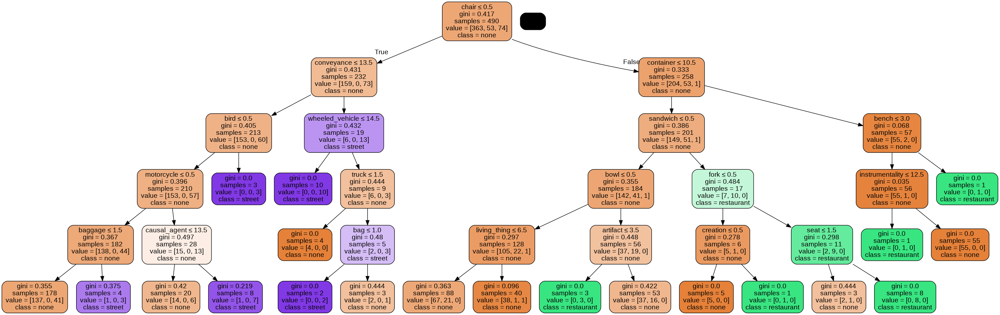

In [60]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns.values.tolist(),class_names=y["label"].unique())
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 6.2 Repeat steps of section 5.4 (Decision Tree Regressor)

Για το restaurant

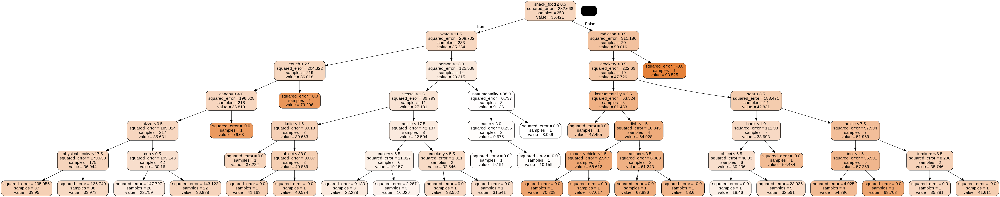

Για το street 


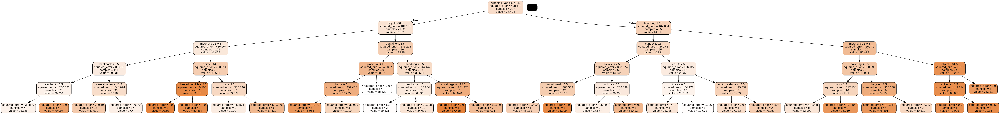

In [ ]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

for place_id in [0,1]:
    img_ids = list(dataset[places[place_id]].coco.keys())
    for image_it in range(len(img_ids)):
        image_id = img_ids[image_it]
        image_url = dataset[places[place_id]].coco[image_id]['url']

        print (f"Image url: {image_url}")
        prob = 0
        try:
            img = read_image_from_url(image_url)
            print("Probability of being a: "+ places[place_id])
            probs = predictor.classifyWithLabels(image_url)
            for p in probs:
                if p[0] == places[place_id]:
                    prob = p[1]
            print(prob)
            df_2.loc[df_2['image_id'] == image_id,places[place_id]] = prob * 100
        except Exception as e:
            print(e)
            continue

df_2

In [61]:
from skimage import io
import torch
from torch.autograd import Variable as V
import torchvision.models as models
from torchvision import transforms as trn
from torch.nn import functional as F
import os
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd

for place_id in [0,1]:
    img_ids = list(dataset[places[place_id]].coco.keys())
    for image_it in range(len(img_ids)):
        image_id = img_ids[image_it]
        image_url = dataset[places[place_id]].coco[image_id]['url']

        print (f"Image url: {image_url}")
        try:
            img = read_image_from_url(image_url)
        except Exception as e:
            print(e)
        print("Probability of being a: "+ places[place_id])
        try:
            preds = predictor.classifyWithLabels(image_url)
            w_all = 0
            pred = 0
            for p in preds:
                sim = -1
                pp = p[0].split('/', 1)[0]
                if len(wn.synsets(p[0].split('/', 1)[0])) != 0:
                    sim = wn.synsets(places[place_id])[0].path_similarity(wn.synsets(pp)[0])
                else:
                    print("No synsets were found for: "+pp)
                    print("Trying individuals...")
                    indivs = pp.split('_')
                    for i in indivs:
                        if len(wn.synsets(i)) != 0:
                            sim = wn.synsets(places[place_id])[0].path_similarity(wn.synsets(i)[0])
                            print("Found for: "+i)
                            break
                if sim == -1:
                    continue
                w_all += p[1]
                pred += sim * p[1]
            pred /= w_all
            print(pred)
        except Exception as e:
            print(e)
            continue
        df_2.loc[df_2['image_id'] == image_id,places[place_id]] = pred * 100
df_2

Image url: http://farm3.staticflickr.com/2667/4444559660_ef50d6d70e_z.jpg
Probability of being a: restaurant
No synsets were found for: television_studio
Trying individuals...
Found for: television
0.1099192136250459
Image url: http://farm5.staticflickr.com/4054/4420226879_2455493263_z.jpg
Probability of being a: restaurant
No synsets were found for: ice_cream_parlor
Trying individuals...
Found for: ice
0.17526738177728693
Image url: http://farm5.staticflickr.com/4026/4420227799_b0b075ee05_z.jpg
Probability of being a: restaurant
No synsets were found for: restaurant_patio
Trying individuals...
Found for: restaurant
0.26756635783110055
Image url: http://farm3.staticflickr.com/2509/3922280340_d09af35238_z.jpg
Probability of being a: restaurant
0.5443439016293266
Image url: http://farm2.staticflickr.com/1420/543023771_46a976f4cf_z.jpg
Probability of being a: restaurant
0.2032951084259892
Image url: http://farm9.staticflickr.com/8141/7640723682_e45033ac22_z.jpg
Probability of being a: res

,label_texts,image_id,label,restaurant,street
0,entity physical_entity object whole artifact i...,505700.0,pub,26.756636,NaN
1,entity physical_entity object whole artifact i...,471245.0,restaurant,54.434390,NaN
2,entity physical_entity object whole artifact i...,285891.0,pizzeria,13.202249,NaN
3,entity physical_entity object whole artifact i...,160940.0,pizzeria,47.270811,NaN
4,entity physical_entity object whole artifact i...,348580.0,restaurant,41.610651,NaN
...,...,...,...,...,...
485,object whole entity living_thing physical_enti...,420425.0,ice_skating_rink,NaN,22.414695
486,entity physical_entity object whole artifact c...,331315.0,crosswalk,NaN,19.817550
487,object whole entity living_thing physical_enti...,41459.0,crosswalk,NaN,35.978570
488,entity physical_entity object whole artifact c...,108701.0,downtown,NaN,18.330371


In [62]:
place = 'patio'
wn.synsets(place.split('/', 1)[0])
"ice_cream_patio".split("_")

['ice', 'cream', 'patio']

In [63]:
df_2_restaurant = pd.concat([df_2,pd.DataFrame(vc.todense(), columns=vectorizer.get_feature_names())],axis=1)
df_2_street = pd.concat([df_2,pd.DataFrame(vc.todense(), columns=vectorizer.get_feature_names())],axis=1)
del df_2_restaurant["street"]
del df_2_street["restaurant"]
del df_2_restaurant["image_id"]
del df_2_restaurant["label_texts"]
del df_2_street["image_id"]
del df_2_street["label_texts"]
df_2_restaurant = df_2_restaurant.dropna()
df_2_street = df_2_street.dropna()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [64]:
df_2_restaurant

,label,restaurant,animal,apple,appliance,article,artifact,backpack,bag,baggage,...,vascular_plant,vase,vehicle,vertebrate,vessel,ware,wheeled_vehicle,white_goods,whole,work
0,pub,26.756636,0,0,0,2,15,0,0,0,...,0,0,0,0,4,2,0,0,17,0
1,restaurant,54.434390,0,0,0,2,9,0,0,0,...,0,0,0,0,2,2,0,0,10,2
2,pizzeria,13.202249,0,0,0,1,8,0,0,0,...,0,0,0,0,0,1,0,0,9,0
3,pizzeria,47.270811,0,0,0,4,19,0,0,0,...,0,0,0,0,11,4,0,0,23,0
4,restaurant,41.610651,0,0,0,8,19,0,0,0,...,0,0,0,0,2,8,0,0,23,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,pizzeria,38.018048,0,0,0,5,8,0,0,0,...,0,0,0,0,1,5,0,0,13,0
249,beer_hall,47.119896,0,0,0,3,4,0,0,0,...,0,0,0,0,0,3,0,0,16,0
250,ice_cream_parlor,38.100353,0,0,0,3,18,0,0,0,...,0,0,0,0,1,3,0,0,19,0
251,art_school,20.397556,0,0,0,7,13,0,0,0,...,0,0,0,0,0,7,0,0,15,0


In [65]:
df_2_street

,label,street,animal,apple,appliance,article,artifact,backpack,bag,baggage,...,vascular_plant,vase,vehicle,vertebrate,vessel,ware,wheeled_vehicle,white_goods,whole,work
253,street,89.308762,1,0,0,0,9,0,0,0,...,0,0,5,1,0,0,5,0,19,0
254,promenade,26.804855,0,0,0,0,7,0,0,0,...,0,0,1,0,0,0,1,0,13,0
255,bus_station,15.964488,0,0,0,0,7,0,0,0,...,0,0,4,0,0,0,4,0,13,0
256,downtown,19.661594,0,0,0,0,8,0,0,0,...,0,0,3,0,0,0,3,0,13,0
257,street,82.671325,0,0,0,0,26,2,2,0,...,0,0,16,0,0,0,16,0,33,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,ice_skating_rink,22.414695,0,0,0,0,9,0,0,2,...,0,0,3,0,0,0,3,0,18,0
486,crosswalk,19.817550,0,0,0,0,22,3,3,0,...,0,0,16,0,0,0,16,0,31,0
487,crosswalk,35.978570,0,0,0,0,14,1,1,0,...,0,0,12,0,0,0,12,0,18,0
488,downtown,18.330371,0,0,0,0,22,0,0,0,...,0,0,19,0,0,0,19,0,30,0


In [66]:
from sklearn.tree import DecisionTreeRegressor 
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

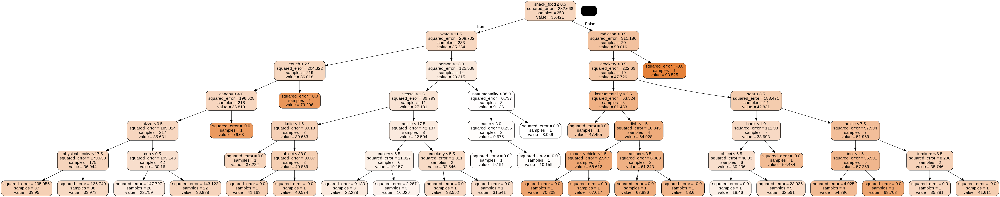

In [67]:
place = "restaurant"
X = df_2_restaurant.loc[:, ~df_2_restaurant.columns.isin([place, 'label'])]
y = df_2_restaurant.loc[:, df_2_restaurant.columns.isin([place])]
regressor = DecisionTreeRegressor(random_state = 0, max_depth=6) 
regressor.fit(X, y)
dot_data = StringIO()
export_graphviz(regressor, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns.values.tolist())
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

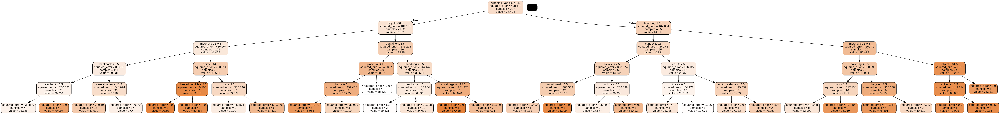

In [68]:
place = "street"
X = df_2_street.loc[:, ~df_2_street.columns.isin([place, 'label'])]
y = df_2_street.loc[:, df_2_street.columns.isin([place])]
regressor = DecisionTreeRegressor(random_state = 0, max_depth=5) 
regressor.fit(X, y)
dot_data = StringIO()
export_graphviz(regressor, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns.values.tolist())
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# 7 SPARQL queries

Σχηματίζουμε ένα σύνολο από SPARQL ερωτήματα (queries) ικανά να διαχωρίσουν ικανοποιητικά τις εικόνες των δύο κλάσεων με χρήση απλών κανόνων, με σκοπό να θέσουμε μια συγκρητική βάση για τον ταξινομητή. Οι κανόνες αυτοί εκμεταλλεύονται τη γνώση που έχουμε δημιουργήσει για να διαχωρίσουν τις εικόνες πετυχαίνοντας πιο ακριβή και αποδοτικά αποτελέσματα.

## 7.1 Street

Το "traffic light" διαχωρίζει ουσιαστικά τα "restaurant" από τα "street". Αντίστοιχα θα μπορούσαμε να χρησιμοποιήσουμε το "signal". Εντυπωσιακό είναι πως αν χρησιμοποιήσουμε το "car" έχουμε περισσότερες εικόνες από αυτές που "κατεβάσαμε" ως street από το COCO dataset, που υπάρχουν εικόνες τύπου  "restaurant" που περιέχουν αμάξια. Θεωρούμε ότι οι εικόνες που έχουν επιπλέον "bus" ή/και"motorcycle" αντιστοιχούν σε "street". Τα αποτελέσματα συμφωνούν τόσο με τα decision trees (ενότητα 5.3) όσο με το  GradCAM (ενότητα  5.5). Έτσι τέτοιου τύπου ερωτήματα οδηγούν σε πιο ακριβή κατηγοριοποίηση ως street, καθώς κάποιες από αυτές μπορεί να μην είναι. Ακολουθούν μερικά από τα query και τα αποτελέσματα τους, εκ των οποίων σε κάποια έχουμε χρησιμοποιήσει έννοιες ανώτερου ιεραρχικού επειπέδου, π.χ. "wheeled vehicle". 



```
prefix my:<http://coco_οntology_rs_new/>
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
select( count(distinct ?a) as ?images )
where {
	?a rdf:type my:Image .
    ?a my:hasObject ?o.
	?o rdf:type my:traffic_light.n.01 .
}
```
Επιστρέφει 347 εικόνες.



```
prefix my:<http://coco_οntology_rs_new/>
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
select( count(distinct ?a) as ?images )
where {
	?a rdf:type my:Image .
    ?a my:hasObject ?traffic_light.
	?traffic_light rdf:type my:traffic_light.n.01 .
    ?a my:hasObject ?bus.
	?bus rdf:type my:bus.n.01 .
}
```
Επιστρέφει 120 εικόνες.




```
prefix my:<http://coco_οntology_rs_new/>
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
select( count(distinct ?a) as ?images )
where {
	?a rdf:type my:Image .
    ?a my:hasObject ?o1.
    {?o1 rdf:type my:motorcycle.n.01} UNION {?o1 rdf:type my:bus.n.01}.
}
```

Επιστρέφει 145 εικόνες.

Χρησιμοποιόντας την ιεραρχία που εξαγάγαμε από το wordnet δοκιμάζουμε οντολογίες ανώτερου ιεραρχικού επιπέδου και παίρνουμε παρόμοια αποτελέσματα (ίδια με του car) με πριν, ομαδοποιώντας αντικείμενα για πιο αποδοτικά ερωτήματα.



```
prefix my:<http://coco_οntology_rs_new/>
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
select( count(distinct ?a) as ?images )
where {
	?a rdf:type my:Image .
    ?a my:hasObject ?o1.
    ?o1 rdf:type my:wheeled_vehicle.n.01
}
```
Επιστρέφει 368 εικόνες.


## 7.2 Restaurant

Το "furniture" διαχωρίζει ουσιαστικά τα "restaurant" από τα "street". Θεωρούμε ότι οι εικόνες που έχουν επιπλέον "vessel" ή/και"dish" αντιστοιχούν σε "restaurant". Τα αποτελέσματα συμφωνούν τόσο με τα decision trees (ενότητα 5.3) όσο με το  GradCAM (ενότητα  5.5). Βλέπουμε ότο το ερώτημα με το "furniture επιτρέφει τις εικόνες που έχουμε κατεβάσει ως "restaurant" και με τον περιορισμό να υπάρχει πιάτο ή κάποιο δοχείο (π.χ. bottle) επιστρέφουμε εικόνες που μπορούν να κατηγοριοποιηθούν ως restaurant, καθώς πολλές από αυτές που κατεβάσαμε από το COCO dataset δεν αντιστοιχόυν πράγματι σε restaurant, όπως φαίνεται και στο 4.3.



```
prefix my:<http://coco_οntology_rs_new/>
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
select( count(distinct ?a) as ?images )
where {
	?a rdf:type my:Image .
    ?a my:hasObject ?o.
    {?o rdf:type my:dish.n.02} UNION {?o rdf:type my:vessel.n.02}
}
```
Επιστρέφει 95 εικόνες.




```
prefix my:<http://coco_οntology_rs_new/>
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
select( count(distinct ?a) as ?images )
where {
	?a rdf:type my:Image .
    ?a my:hasObject ?o.
	?o rdf:type my:furniture.n.01 .
}
```
Επιστρέφει 495 εικόνες.


# 8 Analysis

Στις παραπάνω ενότητες δοκιμάσαμε διαφορετικούς τρόπους με τους οποίους αξιολογήσαμε την ενσωμάτωση της γνώσης στο πρόβλημα της ταξινόμησης. 

Αρχικά, δοκιμάσαμε τον αλγόριθμο LIME (image version) για να εντοπίσουμε pixel-oriented πληροφορία (συγκεκριμένα αντικείμενα) η οποία βοήθησε τον classifier να κάνει την ταξινόμηση. Τα αποτελέσματα που πήραμε ναι μεν εστιάζουν μερικώς σε κάποια σχετικά αντικείμενα, παρ'όλα αυτά δεν είναι ιδιαίτερα ικανοποιητικά όσον αφορά την επεξηγηματικότητα του μοντέλου για το χρήστη. 

Στη συνέχεια, δοκιμάσαμε να χρησιμοποιήσουμε Decision Trees που είναι επεξηγήσιμα εκ φύσεως για να οπτικοποιήσουμε με λογική κανόνων τα πρότυπα που φαίνεται να ακολουθεί ο ταξινομητής. Αυτό κατέστη δυνατό, καθώς το dataset που δημιουργήσαμε στην Ενότητα 2 μας δίνει metadata για τα αντικείμενα που περιέχονται στην εικόνα. Τα δεδομένα αυτά ενισχύθηκαν επιπλέον με την ιεραρχία που συλλέξαμε από το wordnet έτσι ώστε να εντοπίσουμε πρότυπα από διαφορετικά επίπεδα της ιεραρχίας. Τα αποτελέσματα περιγράφονται στην ενότητα 5.3 και είναι αρκετά ικανοποιητικά δεδομένου ότι το δέντρο αποφάσεων έχει εντοπίσει έννοιες από διαφορτικά επίπεδα (πχ. vehicle, snack_food) που χρησιμοποιεί ο ταξινομητής για να κάνει την ταξινόμηση.

Επιπλέον, χρησιμοποιήσαμε τα δέντρα αποφάσεων αντιμετοπίζοντας το πρόβλημα ως πρόβλημα παλινδρόμησης για να καταλάβουμε πάλι τη λογική με την οποία ο ταξινομητής βγάζει υψηλή πιθανότητα για το πραγματικό label. Τα αποτελέσματα είναι εξίσου ικανοποιητικά αφού πάλι φαίνεται να επιλέγονται αντικείμενα από διαφορετικά επίπεδα της ιεραρχίας και σχετικά με το πραγματικό label με χρήση των οποίων φαίνεται πότε ο ταξινομητής βγάζει υψηλή πιθανότητα και πότε όχι.

Μια άλλη μέθοδος που χρησιμοποίησαμε για την επεξήγηση του places classifier, ήταν ο GradCAM. Αυτό είχε πολύ καλύτερα αποτελέσματα από το LIME, όσον αφορά την εξήγηση των αποφάσεων καθώς αυτές ήταν ικανοποιητικές για την επεξηγηματικότα του μοντέλου για το χρήστη, π.χ. για την κατηγοριοποίηση μιας εικόνας ως street σημαντικό ρόλο παίζαν χαρακτηριστικά της εικόνας όπως φανάρια και πινακίδες. 


Το dataset που δημιουργήσαμε παρέχει ένα σύνολο εικόνων το οποίο συνοδεύεται από αντίστοιχα metadata, labels αντικειμένων τα οποία εντοπίζονται στην εικόνα αλλά και της θέσης τους. Ένα τέτοιο dataset είναι ιδιαίτερα χρήσιμο στην επεξήγη συστημάτων λήψης αποφάσεων καθώς ενσωματώνουν επιπλεον γνώση των περιεχομένων των εικόνων η οποία μπορεί να ενισχυθεί με τη χρήση αντίστοιχων έτοιμων πακέτων γνώσης για περαιτέρω επεξήγηση των αποτελεσμάτων. Αντίστοιχα, μέσω τέτοιας γνώσης μπορεί να ενισχυθεί επιπλέον και η απόδοση των συστημάτων προς εξέταση (του ταξινομητή στην περίπτωσή μας), αφού η ένωση (fusion) διαφορετικών ειδών δεδομένων δίνει επιπλέον διαστάσεις στην οπτική του decision maker και μπορεί να βελτιώσει, εν δυνάμει, την απόδοσή του. 

Ωστόσο πρέπει να είμαστε πολύ προσεκτικοί με τη χρήση τέτοιων data set. Ta queries στα metadata μπορούν να παίξουν πολύ βοηθητικό ρόλο στη δημιουργία training δεδομένων για την απόδοση labels, στην περίπτωση που δεν έχουμε όπως εδώ προεκπαιδεμένο classifier (places classifier). 

Επιπρόσθετα πρέπει να είμαστε πολύ προσεκτικοί με την αξιολόγηση του places classifier, καθώς είναι εκπαιδευμένος με πολλές κατηγορίες που μπορεί να είναι συναφείς στο μυαλό μας, για παράδειγμα pizzeria είναι υποκατηγορία του restaurant. Δυνητικά beer_hall, pub, κλπ θα μπορούσαν να θεωρηθούν ως restaurant με την ευρήτερη έννοια του όρου, καθώς υπάρχει και διαθέσιμο φαγητό. 
Για το λόγο αυτό προχωρήσαμε και στη δημιουργία μικρότερου dataset καθώς απορρίψαμε όλες τις εικόνες που το "street" και "restaurant" δεν ήταν στις πρώτες πέντε προβλέψεις του places classifier, ώστε να έχουμε ένα πιο ομοιογενές data set. Επαναλάβαμε τις προαναφερθήσες μεθόδους και για τα μικρότερα data set, παρατηρώντας αντίστοιχα αποτελέσματα.